In [1]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

%matplotlib inline


import datetime

pd.set_option("display.max_columns",None)

In [2]:
from sqlalchemy import create_engine

connection_string = "mysql+mysqlconnector://root:@127.0.0.1:3307/teleprompter"
engine = create_engine(connection_string, echo=False)


query = "SELECT * FROM teleprompter_coding1f"
df_coding1f=pd.read_sql(query, engine)
df_coding1f.head()

#df_coding1a.to_excel("df_coding.xlsx")

,event,event_time,distinct_id,os_version,country_code,event_time2,kod,elofizeto,canceled,trial
0,trial_started_event,1738752685,$device:user_39843188017959,18.1.1,unknown,2025-02-05 11:51:25,100,NaN,1.0,1
1,$ae_iap,1738752688,$device:user_39843188017959,18.1.1,IT,2025-02-05 11:51:28,12,NaN,1.0,1
2,purchasesuccess,1738752691,$device:user_39843188017959,18.1.1,IT,2025-02-05 11:51:31,12,NaN,1.0,1
3,Homescreen,1738752731,$device:user_39843188017959,18.1.1,IT,2025-02-05 11:52:11,8,NaN,1.0,1
4,proUserSignIn,1738752732,$device:user_39843188017959,18.1.1,IT,2025-02-05 11:52:12,9,NaN,1.0,1


In [3]:
df_coding1f_ = df_coding1f[df_coding1f['kod']>9]
df_coding1f_ = df_coding1f_[df_coding1f_['kod']!=100]


In [4]:
df_coding1f_['kod'].value_counts()

kod
12     31241
10     28024
14     19793
11     11648
13      7099
142      333
15       221
141       92
Name: count, dtype: int64

In [5]:
#df_coding1f_.to_excel("df_coding2.xlsx")

In [6]:

query = "SELECT * FROM time_data"
df_time=pd.read_sql(query, engine)
df_time.head()


,distinct_id,TIME2
0,$device:user_00000031868419,5238.0
1,$device:user_00000350001569,1.0
2,$device:user_00000790841147,2442.0
3,$device:user_00001335661017,671.0
4,$device:user_00003069276220,546.0


In [7]:
average_time = df_time.groupby('distinct_id')['TIME2'].mean().rename('average_time')

median_all = df_time.groupby('distinct_id')['TIME2'].median().rename('median_all')
# Medián lekérdezése a 0 értékek kihagyásával distinct_id-nként
median_non_zero = df_time[df_time['TIME2'] != 0].groupby('distinct_id')['TIME2'].median().rename('median_non_zero')

modus_all = df_time.groupby('distinct_id')['TIME2'].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None).rename('modus_all')
# Módusz lekérdezése a 0 értékek kihagyásával distinct_id-nként
modus_non_zero = df_time[df_time['TIME2'] != 0].groupby('distinct_id')['TIME2'].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None).rename('modus_non_zero')

center_points = pd.concat([average_time, median_all, median_non_zero,modus_all,modus_non_zero], axis=1)
center_points = center_points.fillna(0)
center_points

,average_time,median_all,median_non_zero,modus_all,modus_non_zero
distinct_id,,,,,
$RCAnonymousID:user_00011562885193,100.0,100.0,100.0,100.0,100.0
$RCAnonymousID:user_00015162770132,17474.0,17474.0,17474.0,17474.0,17474.0
$RCAnonymousID:user_00037455979772,3002.0,3002.0,3002.0,3002.0,3002.0
$RCAnonymousID:user_00072180058589,525.0,525.0,525.0,525.0,525.0
$RCAnonymousID:user_00117411310025,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...
user_99990666522916,7064.0,7064.0,7064.0,7064.0,7064.0
user_99992357693564,7066.0,7066.0,7066.0,7066.0,7066.0
user_99992622228059,506.0,506.0,506.0,506.0,506.0


In [8]:

query = "SELECT * FROM user_country"
df_country=pd.read_sql(query, engine)
df_country.head()


,distinct_id,country_code
0,$device:user_00000031868419,UA
1,$device:user_00000350001569,FR
2,$device:user_00000790841147,ID
3,$device:user_00001335661017,KZ
4,$device:user_00003069276220,RU


In [9]:
df_country[df_country['distinct_id']=='$device:user_12977629472233']


,distinct_id,country_code
18914,$device:user_12977629472233,NR
18915,$device:user_12977629472233,US


In [10]:

query = "SELECT * FROM user_osver"
df_osver=pd.read_sql(query, engine)
df_osver.head()


,distinct_id,os_version
0,$device:user_00000031868419,18.1.1
1,$device:user_00000350001569,18.0
2,$device:user_00000790841147,17.5.1
3,$device:user_00001335661017,16.2
4,$device:user_00003069276220,16.1.2


In [11]:
df_osver[df_osver['distinct_id']=='$device:user_83238418308962']

,distinct_id,os_version
128990,$device:user_83238418308962,18.3
128991,$device:user_83238418308962,18.1.1


In [12]:
df_country2 = pd.read_excel(".\orszagok.xlsx", sheet_name="vegso", 
                           usecols=['country_name', 'country_code','Continent', 'Population'])
df_country2

,country_name,Continent,Population,country_code
0,Albania,Europe,2854710,AL
1,Algeria,Africa,44177969,DZ
2,Andorra,Europe,79034,AD
3,Angola,Africa,34503774,AO
4,Argentina,South America,44012000,AR
...,...,...,...,...
141,Venezuela,South America,27466364,VE
142,Vietnam,Asia,97468029,VN
143,United States,North America,336997624,VI
144,Zambia,Africa,19473125,ZM


In [13]:
from sqlalchemy import create_engine

connection_string = "mysql+mysqlconnector://root:@127.0.0.1:3307/teleprompter"
engine = create_engine(connection_string, echo=False)


query = "SELECT * FROM mini4"
df_coding1a=pd.read_sql(query, engine)
df_coding1a.head()

,distinct_id,elofizeto,canceled,trial,kod,kod_db,total_time,maxi_,mini_,darab
0,$device:user_00010645661814,NaN,1.0,1,100,2,836,1739138462,1739137626,2
1,$device:user_00010645661814,NaN,1.0,1,100,2,836,1739138462,1739137626,2
2,$device:user_00245049429424,NaN,1.0,1,8,1,8692,1739949846,1739941154,11
3,$device:user_00245049429424,NaN,1.0,1,9,3,8692,1739949846,1739941154,11
4,$device:user_00245049429424,NaN,1.0,1,9,3,8692,1739949846,1739941154,11


In [14]:
#kikukázzuk ami nem kell
df_coding1a = df_coding1a.drop(columns=['maxi_', 'mini_'], axis = 1)
df_coding1a.head()

,distinct_id,elofizeto,canceled,trial,kod,kod_db,total_time,darab
0,$device:user_00010645661814,NaN,1.0,1,100,2,836,2
1,$device:user_00010645661814,NaN,1.0,1,100,2,836,2
2,$device:user_00245049429424,NaN,1.0,1,8,1,8692,11
3,$device:user_00245049429424,NaN,1.0,1,9,3,8692,11
4,$device:user_00245049429424,NaN,1.0,1,9,3,8692,11


In [15]:
#a duplikációk is kuka
df_coding1a =df_coding1a.drop_duplicates(keep='first')
df_coding1a.head()

,distinct_id,elofizeto,canceled,trial,kod,kod_db,total_time,darab
0,$device:user_00010645661814,NaN,1.0,1,100,2,836,2
2,$device:user_00245049429424,NaN,1.0,1,8,1,8692,11
3,$device:user_00245049429424,NaN,1.0,1,9,3,8692,11
6,$device:user_00245049429424,NaN,1.0,1,10,3,8692,11
9,$device:user_00245049429424,NaN,1.0,1,12,2,8692,11


In [16]:
df_coding1a.shape

(81386, 8)

In [17]:
#létrehozzuk a trial, subscriber és cancelled alcsoportokat

In [18]:
trial_users = df_coding1a[df_coding1a['trial'] == 1]
df_trial_users = pd.DataFrame({'distinct_id': trial_users['distinct_id'].unique(), 'trial': 1})
#df_trial_users.head(3)

In [19]:
subscriber_users = df_coding1a[df_coding1a['elofizeto'] == 1]
df_subscriber_users = pd.DataFrame({'distinct_id': subscriber_users['distinct_id'].unique(), 'subscriber': 2})
df_subscriber_users.shape[0]

2628

In [20]:
canceled_users = df_coding1a[df_coding1a['canceled'] == 1]
df_canceled_users = pd.DataFrame({'distinct_id': canceled_users['distinct_id'].unique(), 'canceled': 4})
df_canceled_users.shape[0]

14213

In [21]:
tmp_df = df_coding1a[['distinct_id','total_time','darab']].copy()
uj_mini =tmp_df.drop_duplicates(keep='first')
uj_mini

,distinct_id,total_time,darab
0,$device:user_00010645661814,836,2
2,$device:user_00245049429424,8692,11
13,$device:user_00254383447974,125,15
28,$device:user_00263171700618,429894,107
135,$device:user_00300798025250,237643,198
...,...,...,...
1478809,user_93328311128100,4624,2
1478811,user_94214979502802,604837,139
1478950,user_97547717625156,25812,26
1478976,user_98547496858399,576034,18


In [22]:
query = "SELECT * FROM days"
df_days=pd.read_sql(query, engine)
df_days.head()

,distinct_id,WEEK,WEEKDAY,dayofyear
0,$device:user_39843188017959,6,2,35
1,$device:user_39843188017959,6,2,35
2,$device:user_39843188017959,6,2,35
3,$device:user_39843188017959,6,2,35
4,$device:user_39843188017959,6,2,35


In [23]:
temp = df_days[['distinct_id','WEEK']]
uniqueWeeks = temp['WEEK'].unique().tolist()
df_weeks = pd.DataFrame({'distinct_id': temp['distinct_id'].unique()})
for week in uniqueWeeks:
    tmp = temp[temp['WEEK'] == week ]
    counts = tmp['distinct_id'].value_counts().reset_index()
    counts.columns = ['distinct_id', f'week_{int(week)}']
    df_weeks = pd.merge(df_weeks,counts, how = 'left', on = 'distinct_id')
df_weeks = df_weeks.fillna(0)
df_weeks

,distinct_id,week_6,week_7,week_5,week_4,week_8,week_1,week_9,week_3,week_2
0,$device:user_39843188017959,176.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,$device:user_70911545770631,221.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,$device:user_00537276903347,71.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0
3,$device:user_19268739989418,37.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,$device:user_16347416100113,0.0,0.0,98.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
16836,$device:user_69690961346103,45.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16837,$device:user_23062396468934,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
16838,$device:user_92149260304779,0.0,84.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0
16839,$device:user_21451424331325,134.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [24]:
temp = df_days[['distinct_id','WEEKDAY']]
uniqueWeeks = temp['WEEKDAY'].unique().tolist()
df_weekdays = pd.DataFrame({'distinct_id': temp['distinct_id'].unique()})
for week in uniqueWeeks:
    tmp = temp[temp['WEEKDAY'] == week ]
    counts = tmp['distinct_id'].value_counts().reset_index()
    counts.columns = ['distinct_id', f'weekday_{int(week)}']
    df_weekdays = pd.merge(df_weekdays,counts, how = 'left', on = 'distinct_id')
df_weekdays = df_weekdays.fillna(0)
df_weekdays["weekend"] = df_weekdays['weekday_6'] + df_weekdays['weekday_5'] 
df_weekdays["weekday"] = df_weekdays['weekday_0'] + df_weekdays['weekday_1'] + df_weekdays['weekday_2'] + df_weekdays['weekday_3'] + df_weekdays['weekday_4']
df_weekdays

,distinct_id,weekday_2,weekday_3,weekday_1,weekday_0,weekday_5,weekday_6,weekday_4,weekend,weekday
0,$device:user_39843188017959,168.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,176.0
1,$device:user_70911545770631,0.0,0.0,40.0,183.0,0.0,0.0,0.0,0.0,223.0
2,$device:user_00537276903347,0.0,56.0,1.0,70.0,0.0,0.0,44.0,0.0,171.0
3,$device:user_19268739989418,37.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,37.0
4,$device:user_16347416100113,0.0,0.0,0.0,0.0,98.0,0.0,0.0,98.0,0.0
...,...,...,...,...,...,...,...,...,...,...
16836,$device:user_69690961346103,0.0,0.0,0.0,0.0,9.0,47.0,0.0,56.0,0.0
16837,$device:user_23062396468934,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
16838,$device:user_92149260304779,0.0,86.0,0.0,0.0,0.0,0.0,0.0,0.0,86.0
16839,$device:user_21451424331325,0.0,0.0,0.0,0.0,0.0,0.0,134.0,0.0,134.0


In [25]:
temp = df_days[['distinct_id','dayofyear']]
uniqueWeeks = temp['dayofyear'].unique().tolist()
df_dayofyear = pd.DataFrame({'distinct_id': temp['distinct_id'].unique()})
for week in uniqueWeeks:
    tmp = temp[temp['dayofyear'] == week ]
    counts = tmp['distinct_id'].value_counts().reset_index()
    counts.columns = ['distinct_id', f'dayofyear_{int(week)}']
    df_dayofyear = pd.merge(df_dayofyear,counts, how = 'left', on = 'distinct_id')
df_dayofyear = df_dayofyear.fillna(0)
df_dayofyear

,distinct_id,dayofyear_35,dayofyear_36,dayofyear_34,dayofyear_33,dayofyear_40,dayofyear_31,dayofyear_32,dayofyear_23,dayofyear_22,dayofyear_45,dayofyear_43,dayofyear_46,dayofyear_44,dayofyear_47,dayofyear_2,dayofyear_1,dayofyear_53,dayofyear_54,dayofyear_49,dayofyear_19,dayofyear_28,dayofyear_18,dayofyear_30,dayofyear_29,dayofyear_20,dayofyear_21,dayofyear_37,dayofyear_38,dayofyear_39,dayofyear_41,dayofyear_42,dayofyear_0,dayofyear_11,dayofyear_9,dayofyear_12,dayofyear_7,dayofyear_14,dayofyear_57,dayofyear_48,dayofyear_56,dayofyear_51,dayofyear_50,dayofyear_24,dayofyear_27,dayofyear_25,dayofyear_26,dayofyear_52,dayofyear_5,dayofyear_6,dayofyear_3,dayofyear_55,dayofyear_16,dayofyear_13,dayofyear_10,dayofyear_8,dayofyear_4,dayofyear_15,dayofyear_58,dayofyear_17,dayofyear_59
0,$device:user_39843188017959,168.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,$device:user_70911545770631,0.0,0.0,40.0,181.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,$device:user_00537276903347,0.0,0.0,1.0,70.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,56.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,$device:user_19268739989418,37.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,$device:user_16347416100113,0.0,0.0,0.0,0.0,0.0,98.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16836,$device:user_69690961346103,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16837,$device:user_23062396468934,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16838,$device:user_92149260304779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,84.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16839,$device:user_21451424331325,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,134.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [26]:
uniqueWeeks = temp['dayofyear'].unique().min()
uniqueWeeks

0

In [27]:
uniqueWeeks = temp['dayofyear'].unique().max()
uniqueWeeks

59

In [28]:
dayofyear_cols = [col for col in df_dayofyear.columns if col.startswith('dayofyear_')]

def get_min_dayofyear_index(row):
    """Visszaadja a minimum nem-nulla érték indexét a 'dayofyear' oszlopokban."""
    min_val = np.inf
    min_index = None
    for col in dayofyear_cols:
        value = row[col]
        if value > 0 and value < min_val:
            min_val = value
            min_index = int(col.split('_')[1])
    return min_index

def get_max_dayofyear_index(row):
    """Visszaadja a maximum érték indexét a 'dayofyear' oszlopokban."""
    max_val = -np.inf
    max_index = None
    for col in dayofyear_cols:
        value = row[col]
        if value > max_val:
            max_val = value
            max_index = int(col.split('_')[1])
    return max_index

df_dayofyear['min_dayofyear'] = df_dayofyear.apply(get_min_dayofyear_index, axis=1)
df_dayofyear['max_dayofyear'] = df_dayofyear.apply(get_max_dayofyear_index, axis=1)

df_dayofyear

,distinct_id,dayofyear_35,dayofyear_36,dayofyear_34,dayofyear_33,dayofyear_40,dayofyear_31,dayofyear_32,dayofyear_23,dayofyear_22,dayofyear_45,dayofyear_43,dayofyear_46,dayofyear_44,dayofyear_47,dayofyear_2,dayofyear_1,dayofyear_53,dayofyear_54,dayofyear_49,dayofyear_19,dayofyear_28,dayofyear_18,dayofyear_30,dayofyear_29,dayofyear_20,dayofyear_21,dayofyear_37,dayofyear_38,dayofyear_39,dayofyear_41,dayofyear_42,dayofyear_0,dayofyear_11,dayofyear_9,dayofyear_12,dayofyear_7,dayofyear_14,dayofyear_57,dayofyear_48,dayofyear_56,dayofyear_51,dayofyear_50,dayofyear_24,dayofyear_27,dayofyear_25,dayofyear_26,dayofyear_52,dayofyear_5,dayofyear_6,dayofyear_3,dayofyear_55,dayofyear_16,dayofyear_13,dayofyear_10,dayofyear_8,dayofyear_4,dayofyear_15,dayofyear_58,dayofyear_17,dayofyear_59,min_dayofyear,max_dayofyear
0,$device:user_39843188017959,168.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36,35
1,$device:user_70911545770631,0.0,0.0,40.0,181.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40,33
2,$device:user_00537276903347,0.0,0.0,1.0,70.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,56.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34,33
3,$device:user_19268739989418,37.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,35,35
4,$device:user_16347416100113,0.0,0.0,0.0,0.0,0.0,98.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16836,$device:user_69690961346103,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46,39
16837,$device:user_23062396468934,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28,28
16838,$device:user_92149260304779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,84.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50,43
16839,$device:user_21451424331325,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,134.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,37,37


In [29]:
df_dayofyear['day_count'] = df_dayofyear[dayofyear_cols].apply(lambda row: (row != 0).sum(), axis=1)
df_dayofyear

,distinct_id,dayofyear_35,dayofyear_36,dayofyear_34,dayofyear_33,dayofyear_40,dayofyear_31,dayofyear_32,dayofyear_23,dayofyear_22,dayofyear_45,dayofyear_43,dayofyear_46,dayofyear_44,dayofyear_47,dayofyear_2,dayofyear_1,dayofyear_53,dayofyear_54,dayofyear_49,dayofyear_19,dayofyear_28,dayofyear_18,dayofyear_30,dayofyear_29,dayofyear_20,dayofyear_21,dayofyear_37,dayofyear_38,dayofyear_39,dayofyear_41,dayofyear_42,dayofyear_0,dayofyear_11,dayofyear_9,dayofyear_12,dayofyear_7,dayofyear_14,dayofyear_57,dayofyear_48,dayofyear_56,dayofyear_51,dayofyear_50,dayofyear_24,dayofyear_27,dayofyear_25,dayofyear_26,dayofyear_52,dayofyear_5,dayofyear_6,dayofyear_3,dayofyear_55,dayofyear_16,dayofyear_13,dayofyear_10,dayofyear_8,dayofyear_4,dayofyear_15,dayofyear_58,dayofyear_17,dayofyear_59,min_dayofyear,max_dayofyear,day_count
0,$device:user_39843188017959,168.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36,35,2
1,$device:user_70911545770631,0.0,0.0,40.0,181.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40,33,3
2,$device:user_00537276903347,0.0,0.0,1.0,70.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,56.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34,33,4
3,$device:user_19268739989418,37.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,35,35,1
4,$device:user_16347416100113,0.0,0.0,0.0,0.0,0.0,98.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31,31,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16836,$device:user_69690961346103,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46,39,3
16837,$device:user_23062396468934,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28,28,2
16838,$device:user_92149260304779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,84.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50,43,2
16839,$device:user_21451424331325,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,134.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,37,37,1


In [30]:
def compare_adjacent_pairs(row):
    """Összehasonlítja a szomszédos 'dayofyear_' párokat és visszaadja az eredményeket egy szótárban."""
    results = {}
    dayofyear_cols = [col for col in row.index if col.startswith('dayofyear_')]
    dayofyear_cols.sort(key=lambda x: int(x.split('_')[1]))  # Biztosítjuk a helyes sorrendet

    for i in range(len(dayofyear_cols) - 1):
        col1 = dayofyear_cols[i]
        col2 = dayofyear_cols[i+1]
        var_name = f'tmp_{int(col1.split("_")[1])}'
        val1 = row[col1]
        val2 = row[col2]
        if val1 > val2:
            results[var_name] = -1
        elif val2 > val1:
            results[var_name] = 1
        else:
            results[var_name] = 0
    return pd.Series(results)

df_dayofyear = pd.concat([df_dayofyear, df_dayofyear.apply(compare_adjacent_pairs, axis=1)], axis=1)
df_dayofyear

,distinct_id,dayofyear_35,dayofyear_36,dayofyear_34,dayofyear_33,dayofyear_40,dayofyear_31,dayofyear_32,dayofyear_23,dayofyear_22,dayofyear_45,dayofyear_43,dayofyear_46,dayofyear_44,dayofyear_47,dayofyear_2,dayofyear_1,dayofyear_53,dayofyear_54,dayofyear_49,dayofyear_19,dayofyear_28,dayofyear_18,dayofyear_30,dayofyear_29,dayofyear_20,dayofyear_21,dayofyear_37,dayofyear_38,dayofyear_39,dayofyear_41,dayofyear_42,dayofyear_0,dayofyear_11,dayofyear_9,dayofyear_12,dayofyear_7,dayofyear_14,dayofyear_57,dayofyear_48,dayofyear_56,dayofyear_51,dayofyear_50,dayofyear_24,dayofyear_27,dayofyear_25,dayofyear_26,dayofyear_52,dayofyear_5,dayofyear_6,dayofyear_3,dayofyear_55,dayofyear_16,dayofyear_13,dayofyear_10,dayofyear_8,dayofyear_4,dayofyear_15,dayofyear_58,dayofyear_17,dayofyear_59,min_dayofyear,max_dayofyear,day_count,tmp_0,tmp_1,tmp_2,tmp_3,tmp_4,tmp_5,tmp_6,tmp_7,tmp_8,tmp_9,tmp_10,tmp_11,tmp_12,tmp_13,tmp_14,tmp_15,tmp_16,tmp_17,tmp_18,tmp_19,tmp_20,tmp_21,tmp_22,tmp_23,tmp_24,tmp_25,tmp_26,tmp_27,tmp_28,tmp_29,tmp_30,tmp_31,tmp_32,tmp_33,tmp_34,tmp_35,tmp_36,tmp_37,tmp_38,tmp_39,tmp_40,tmp_41,tmp_42,tmp_43,tmp_44,tmp_45,tmp_46,tmp_47,tmp_48,tmp_49,tmp_50,tmp_51,tmp_52,tmp_53,tmp_54,tmp_55,tmp_56,tmp_57,tmp_58
0,$device:user_39843188017959,168.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36,35,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,$device:user_70911545770631,0.0,0.0,40.0,181.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40,33,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,-1,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,$device:user_00537276903347,0.0,0.0,1.0,70.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,56.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34,33,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,-1,0,1,-1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,$device:user_19268739989418,37.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,35,35,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,$device:user_16347416100113,0.0,0.0,0.0,0.0,0.0,98.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31,31,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16836,$device:user_69690961346103,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46,3

In [31]:
tmp_cols = [col for col in df_dayofyear.columns if col.startswith('tmp_')]

# Összeadjuk a tmp_ oszlopok értékeit soronként
df_dayofyear['napi_tendencia'] = df_dayofyear[tmp_cols].sum(axis=1)
df_dayofyear['napi_tendencia'].value_counts()

napi_tendencia
 0    13303
-1     2493
 1      635
-2      315
-3       52
 2       34
 3        4
-4        4
 5        1
Name: count, dtype: int64

In [32]:
#df_dayofyear = df_dayofyear[['distinct_id','min_dayofyear','max_dayofyear','day_count','napi_tendencia']]
df_dayofyear

,distinct_id,dayofyear_35,dayofyear_36,dayofyear_34,dayofyear_33,dayofyear_40,dayofyear_31,dayofyear_32,dayofyear_23,dayofyear_22,dayofyear_45,dayofyear_43,dayofyear_46,dayofyear_44,dayofyear_47,dayofyear_2,dayofyear_1,dayofyear_53,dayofyear_54,dayofyear_49,dayofyear_19,dayofyear_28,dayofyear_18,dayofyear_30,dayofyear_29,dayofyear_20,dayofyear_21,dayofyear_37,dayofyear_38,dayofyear_39,dayofyear_41,dayofyear_42,dayofyear_0,dayofyear_11,dayofyear_9,dayofyear_12,dayofyear_7,dayofyear_14,dayofyear_57,dayofyear_48,dayofyear_56,dayofyear_51,dayofyear_50,dayofyear_24,dayofyear_27,dayofyear_25,dayofyear_26,dayofyear_52,dayofyear_5,dayofyear_6,dayofyear_3,dayofyear_55,dayofyear_16,dayofyear_13,dayofyear_10,dayofyear_8,dayofyear_4,dayofyear_15,dayofyear_58,dayofyear_17,dayofyear_59,min_dayofyear,max_dayofyear,day_count,tmp_0,tmp_1,tmp_2,tmp_3,tmp_4,tmp_5,tmp_6,tmp_7,tmp_8,tmp_9,tmp_10,tmp_11,tmp_12,tmp_13,tmp_14,tmp_15,tmp_16,tmp_17,tmp_18,tmp_19,tmp_20,tmp_21,tmp_22,tmp_23,tmp_24,tmp_25,tmp_26,tmp_27,tmp_28,tmp_29,tmp_30,tmp_31,tmp_32,tmp_33,tmp_34,tmp_35,tmp_36,tmp_37,tmp_38,tmp_39,tmp_40,tmp_41,tmp_42,tmp_43,tmp_44,tmp_45,tmp_46,tmp_47,tmp_48,tmp_49,tmp_50,tmp_51,tmp_52,tmp_53,tmp_54,tmp_55,tmp_56,tmp_57,tmp_58,napi_tendencia
0,$device:user_39843188017959,168.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36,35,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1
1,$device:user_70911545770631,0.0,0.0,40.0,181.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40,33,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,-1,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1
2,$device:user_00537276903347,0.0,0.0,1.0,70.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,56.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34,33,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,-1,0,1,-1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-2
3,$device:user_19268739989418,37.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,35,35,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,$device:user_16347416100113,0.0,0.0,0.0,0.0,0.0,98.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31,31,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16836,$device:user_69690961346103,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [33]:
#átrendezzük sorokba a usereket. innét kezdve 1 user 1 sor

In [34]:
uniqueKod = df_coding1a['kod'].unique().tolist()
uniqueKod

[100, 8, 9, 10, 12, 11, 13, 14, 15, 142, 141]

In [35]:

df = pd.DataFrame({'distinct_id': df_coding1a['distinct_id'].unique()})
for kod in uniqueKod:
    tmp = df_coding1a[df_coding1a['kod'] == kod ]
    tmp = tmp[['distinct_id','kod_db']]
    tmp = tmp.drop_duplicates()
    tmp.columns = ['distinct_id','db_'+str(kod)]
    df = pd.merge(df,tmp, how = 'left', on = 'distinct_id')
df = df.fillna(0)
df

,distinct_id,db_100,db_8,db_9,db_10,db_12,db_11,db_13,db_14,db_15,db_142,db_141
0,$device:user_00010645661814,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,$device:user_00245049429424,2,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0
2,$device:user_00254383447974,2,3.0,5.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0
3,$device:user_00263171700618,2,19.0,68.0,4.0,9.0,2.0,2.0,1.0,0.0,0.0,0.0
4,$device:user_00300798025250,2,29.0,156.0,2.0,2.0,5.0,2.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
16836,user_93328311128100,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16837,user_94214979502802,2,21.0,109.0,4.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0
16838,user_97547717625156,2,3.0,16.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0
16839,user_98547496858399,2,1.0,9.0,3.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0


In [36]:
# a userekhez hozzáillesztük a trial/cancelled/subscription státuszukat, ill, hogy mennyi időt töltöttek a 
#trial és a cancelled/subscriber állapot között, és hány interakciójuk volt, és egyebeket
df = pd.merge(df,df_trial_users, how = 'left', on = 'distinct_id')
df = pd.merge(df,df_subscriber_users, how = 'left', on = 'distinct_id')
df = pd.merge(df,df_canceled_users, how = 'left', on = 'distinct_id')
df = pd.merge(df,uj_mini, how = 'left', on = 'distinct_id')
df = pd.merge(df,df_time, how = 'left', on = 'distinct_id')
df = pd.merge(df,df_country, how = 'left', on = 'distinct_id')
df = pd.merge(df,df_osver, how = 'left', on = 'distinct_id')
df = pd.merge(df,df_country2, how = 'left', on = 'country_code')
df = pd.merge(df,center_points, how = 'left', on = 'distinct_id')
df = pd.merge(df,df_weeks, how = 'left', on = 'distinct_id')
df = pd.merge(df,df_weekdays, how = 'left', on = 'distinct_id')
df = pd.merge(df,df_dayofyear, how = 'left', on = 'distinct_id')


df

,distinct_id,db_100,db_8,db_9,db_10,db_12,db_11,db_13,db_14,db_15,db_142,db_141,trial,subscriber,canceled,total_time,darab,TIME2,country_code,os_version,country_name,Continent,Population,average_time,median_all,median_non_zero,modus_all,modus_non_zero,week_6,week_7,week_5,week_4,week_8,week_1,week_9,week_3,week_2,weekday_2,weekday_3,weekday_1,weekday_0,weekday_5,weekday_6,weekday_4,weekend,weekday,dayofyear_35,dayofyear_36,dayofyear_34,dayofyear_33,dayofyear_40,dayofyear_31,dayofyear_32,dayofyear_23,dayofyear_22,dayofyear_45,dayofyear_43,dayofyear_46,dayofyear_44,dayofyear_47,dayofyear_2,dayofyear_1,dayofyear_53,dayofyear_54,dayofyear_49,dayofyear_19,dayofyear_28,dayofyear_18,dayofyear_30,dayofyear_29,dayofyear_20,dayofyear_21,dayofyear_37,dayofyear_38,dayofyear_39,dayofyear_41,dayofyear_42,dayofyear_0,dayofyear_11,dayofyear_9,dayofyear_12,dayofyear_7,dayofyear_14,dayofyear_57,dayofyear_48,dayofyear_56,dayofyear_51,dayofyear_50,dayofyear_24,dayofyear_27,dayofyear_25,dayofyear_26,dayofyear_52,dayofyear_5,dayofyear_6,dayofyear_3,dayofyear_55,dayofyear_16,dayofyear_13,dayofyear_10,dayofyear_8,dayofyear_4,dayofyear_15,dayofyear_58,dayofyear_17,dayofyear_59,min_dayofyear,max_dayofyear,day_count,tmp_0,tmp_1,tmp_2,tmp_3,tmp_4,tmp_5,tmp_6,tmp_7,tmp_8,tmp_9,tmp_10,tmp_11,tmp_12,tmp_13,tmp_14,tmp_15,tmp_16,tmp_17,tmp_18,tmp_19,tmp_20,tmp_21,tmp_22,tmp_23,tmp_24,tmp_25,tmp_26,tmp_27,tmp_28,tmp_29,tmp_30,tmp_31,tmp_32,tmp_33,tmp_34,tmp_35,tmp_36,tmp_37,tmp_38,tmp_39,tmp_40,tmp_41,tmp_42,tmp_43,tmp_44,tmp_45,tmp_46,tmp_47,tmp_48,tmp_49,tmp_50,tmp_51,tmp_52,tmp_53,tmp_54,tmp_55,tmp_56,tmp_57,tmp_58,napi_tendencia
0,$device:user_00010645661814,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,NaN,4.0,836,2,0.0,NaN,18.3,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39,39,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,$device:user_00245049429424,2,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1,NaN,4.0,8692,11,645.0,KZ,18.1.1,Kazakhstan,Asia,19196465.0,645.0,645.0,645.0,645.0,645.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49,49,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0
2,$device:user_00254383447974,2,3.0,5.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1,NaN,4.0,125,15,932.0,ID,18.0,Indonesia,Asia,273753191.0,932.0,932.0,932.0,932.0,932.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19,19,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,$device:user_00263171700618,2,19.0,68.0,4.0,9.0,2.0,2.0,1.0,0.0,0.0,0.0,1,NaN,4.0,429894,107,2778.0,US,18.2,United States,North America,336997624.0,2778.0,2778.0,2778.0,2778.0,2778.0,0.0,0.0,0.0,0.0,0.0,53.0,0.0,0.0,54.0,0.0,0.0,2.0,6.0,0.0,53.0,46.0,53.0,54.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,53.0,0.0,0.0,0.0,0.0,6,4,4,0,0,0,1,-1,-1,-1,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [37]:
df[df['distinct_id']=='$device:user_12977629472233']

,distinct_id,db_100,db_8,db_9,db_10,db_12,db_11,db_13,db_14,db_15,db_142,db_141,trial,subscriber,canceled,total_time,darab,TIME2,country_code,os_version,country_name,Continent,Population,average_time,median_all,median_non_zero,modus_all,modus_non_zero,week_6,week_7,week_5,week_4,week_8,week_1,week_9,week_3,week_2,weekday_2,weekday_3,weekday_1,weekday_0,weekday_5,weekday_6,weekday_4,weekend,weekday,dayofyear_35,dayofyear_36,dayofyear_34,dayofyear_33,dayofyear_40,dayofyear_31,dayofyear_32,dayofyear_23,dayofyear_22,dayofyear_45,dayofyear_43,dayofyear_46,dayofyear_44,dayofyear_47,dayofyear_2,dayofyear_1,dayofyear_53,dayofyear_54,dayofyear_49,dayofyear_19,dayofyear_28,dayofyear_18,dayofyear_30,dayofyear_29,dayofyear_20,dayofyear_21,dayofyear_37,dayofyear_38,dayofyear_39,dayofyear_41,dayofyear_42,dayofyear_0,dayofyear_11,dayofyear_9,dayofyear_12,dayofyear_7,dayofyear_14,dayofyear_57,dayofyear_48,dayofyear_56,dayofyear_51,dayofyear_50,dayofyear_24,dayofyear_27,dayofyear_25,dayofyear_26,dayofyear_52,dayofyear_5,dayofyear_6,dayofyear_3,dayofyear_55,dayofyear_16,dayofyear_13,dayofyear_10,dayofyear_8,dayofyear_4,dayofyear_15,dayofyear_58,dayofyear_17,dayofyear_59,min_dayofyear,max_dayofyear,day_count,tmp_0,tmp_1,tmp_2,tmp_3,tmp_4,tmp_5,tmp_6,tmp_7,tmp_8,tmp_9,tmp_10,tmp_11,tmp_12,tmp_13,tmp_14,tmp_15,tmp_16,tmp_17,tmp_18,tmp_19,tmp_20,tmp_21,tmp_22,tmp_23,tmp_24,tmp_25,tmp_26,tmp_27,tmp_28,tmp_29,tmp_30,tmp_31,tmp_32,tmp_33,tmp_34,tmp_35,tmp_36,tmp_37,tmp_38,tmp_39,tmp_40,tmp_41,tmp_42,tmp_43,tmp_44,tmp_45,tmp_46,tmp_47,tmp_48,tmp_49,tmp_50,tmp_51,tmp_52,tmp_53,tmp_54,tmp_55,tmp_56,tmp_57,tmp_58,napi_tendencia
9221,$device:user_12977629472233,2,6.0,12.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1,NaN,4.0,224685,23,1143.0,NR,18.1.1,Nauru,Oceania,9122.0,1143.0,1143.0,1143.0,1143.0,1143.0,0.0,22.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,22.0,0.0,22.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49,46,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,1,-1,0,0,0,0,0,0,0,0,0,0
9222,$device:user_12977629472233,2,6.0,12.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1,NaN,4.0,224685,23,1143.0,US,18.1.1,United States,North America,336997624.0,1143.0,1143.0,1143.0,1143.0,1143.0,0.0,22.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,22.0,0.0,22.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49,46,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,1,-1,0,0,0,0,0,0,0,0,0,0


In [38]:
#a valódi interakciók száma
#db_8 nem valódi, mert csak olyan kattingatások, amelyekkel pl visszatér valamilyen folyamatról: bezárja az ablakot
#db_10 ilyen olyan idegeseítő interakciók amiket a rendszer ad
#db_11 rendszerhibaüzik
#db_15 a teleprompter által (és nem a felhasználó által) indított interakciók
df['db_valodi'] = df['db_12'] +df['db_13'] +df['db_14'] +df['db_141'] +df['db_142'] +df['db_9'] 

In [39]:
df['time_per_darab'] =df['total_time']/df['db_valodi'] 
df['time_per_valodi_darab'] =df['TIME2']/df['db_valodi'] 

In [40]:
df = df.fillna(0)

In [41]:
df['subscriber'].value_counts()

subscriber
0.0    15962
2.0     3094
Name: count, dtype: int64

In [42]:
df_nem_valodi = df[df['db_valodi'] == 0]
df_nem_valodi['subscriber'].value_counts()

subscriber
0.0    3987
2.0    1056
Name: count, dtype: int64

In [43]:
df_nem_valodi_feliratkozo = df_nem_valodi[df_nem_valodi['subscriber'] == 2]
df_nem_valodi_feliratkozo

,distinct_id,db_100,db_8,db_9,db_10,db_12,db_11,db_13,db_14,db_15,db_142,db_141,trial,subscriber,canceled,total_time,darab,TIME2,country_code,os_version,country_name,Continent,Population,average_time,median_all,median_non_zero,modus_all,modus_non_zero,week_6,week_7,week_5,week_4,week_8,week_1,week_9,week_3,week_2,weekday_2,weekday_3,weekday_1,weekday_0,weekday_5,weekday_6,weekday_4,weekend,weekday,dayofyear_35,dayofyear_36,dayofyear_34,dayofyear_33,dayofyear_40,dayofyear_31,dayofyear_32,dayofyear_23,dayofyear_22,dayofyear_45,dayofyear_43,dayofyear_46,dayofyear_44,dayofyear_47,dayofyear_2,dayofyear_1,dayofyear_53,dayofyear_54,dayofyear_49,dayofyear_19,dayofyear_28,dayofyear_18,dayofyear_30,dayofyear_29,dayofyear_20,dayofyear_21,dayofyear_37,dayofyear_38,dayofyear_39,dayofyear_41,dayofyear_42,dayofyear_0,dayofyear_11,dayofyear_9,dayofyear_12,dayofyear_7,dayofyear_14,dayofyear_57,dayofyear_48,dayofyear_56,dayofyear_51,dayofyear_50,dayofyear_24,dayofyear_27,dayofyear_25,dayofyear_26,dayofyear_52,dayofyear_5,dayofyear_6,dayofyear_3,dayofyear_55,dayofyear_16,dayofyear_13,dayofyear_10,dayofyear_8,dayofyear_4,dayofyear_15,dayofyear_58,dayofyear_17,dayofyear_59,min_dayofyear,max_dayofyear,day_count,tmp_0,tmp_1,tmp_2,tmp_3,tmp_4,tmp_5,tmp_6,tmp_7,tmp_8,tmp_9,tmp_10,tmp_11,tmp_12,tmp_13,tmp_14,tmp_15,tmp_16,tmp_17,tmp_18,tmp_19,tmp_20,tmp_21,tmp_22,tmp_23,tmp_24,tmp_25,tmp_26,tmp_27,tmp_28,tmp_29,tmp_30,tmp_31,tmp_32,tmp_33,tmp_34,tmp_35,tmp_36,tmp_37,tmp_38,tmp_39,tmp_40,tmp_41,tmp_42,tmp_43,tmp_44,tmp_45,tmp_46,tmp_47,tmp_48,tmp_49,tmp_50,tmp_51,tmp_52,tmp_53,tmp_54,tmp_55,tmp_56,tmp_57,tmp_58,napi_tendencia,db_valodi,time_per_darab,time_per_valodi_darab
2967,$device:user_00095235549965,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,2.0,0.0,576043,2,0.0,0,18.2.1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,2,2,0,1,-1,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,inf,0.0
2968,$device:user_00095235549965,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,2.0,0.0,576043,2,0.0,0,18.1.1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,2,2,0,1,-1,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,inf,0.0
2969,$device:user_00095235549965,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,2.0,0.0,576043,2,0.0,0,17.5.1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,2,2,0,1,-1,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,inf,0.0
3002,$device:user_01516015616573,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,2.0,0.0,576186,2,0.0,0,18.3,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21,21,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [44]:
df_nem_valodi_feliratkozo['darab'].value_counts()

darab
2    1055
3       1
Name: count, dtype: int64

In [45]:
#csak azokat tartsuk meg, ahol valóban volt esemény. 
# a többiek valószínűleg máshol más néven regisztráltak már és ismerik a rendszert
df = df[df['darab']>4]

In [46]:
feliratkozo = df[df['subscriber']==2]
feliratkozo['darab'].value_counts().sort_values(ascending=True)

darab
358      1
317      1
448      1
326      1
1258     1
        ..
80      19
24      20
11      22
44      23
10      25
Name: count, Length: 506, dtype: int64

In [47]:
feliratkozo['db_valodi'].value_counts().sort_index(ascending=True)

db_valodi
2.0        4
3.0       16
4.0       26
5.0       33
6.0       11
          ..
1575.0     1
1696.0     1
1832.0     1
2405.0     1
3000.0     1
Name: count, Length: 450, dtype: int64

In [48]:
df.shape

(13559, 172)

In [50]:
df['subscriber_or_cancelled'] =df['trial'] + df['subscriber'] + df['canceled']
df['subscriber_or_cancelled'].value_counts()

subscriber_or_cancelled
5.0    11535
3.0     2024
Name: count, dtype: int64

In [51]:
def binaris(ertek):
    if (ertek>0):
        ertek = 1
    else:
        ertek = 0
    return ertek

In [52]:
df.columns

Index(['distinct_id', 'db_100', 'db_8', 'db_9', 'db_10', 'db_12', 'db_11',
       'db_13', 'db_14', 'db_15',
       ...
       'tmp_54', 'tmp_55', 'tmp_56', 'tmp_57', 'tmp_58', 'napi_tendencia',
       'db_valodi', 'time_per_darab', 'time_per_valodi_darab',
       'subscriber_or_cancelled'],
      dtype='object', length=173)

In [53]:
df['db_140'] =df['db_141']+ df['db_142']+df['db_14'] 

In [54]:
#beállítunk igen/nem típusú változót is
kell = ['db_8','db_9', 'db_10', 'db_11', 'db_12', 'db_13', 'db_140', 'db_14', 'db_141', 'db_142',  'db_15']
for most in kell:
    df[most+"_b"] =df[most].apply(binaris) 
df

,distinct_id,db_100,db_8,db_9,db_10,db_12,db_11,db_13,db_14,db_15,db_142,db_141,trial,subscriber,canceled,total_time,darab,TIME2,country_code,os_version,country_name,Continent,Population,average_time,median_all,median_non_zero,modus_all,modus_non_zero,week_6,week_7,week_5,week_4,week_8,week_1,week_9,week_3,week_2,weekday_2,weekday_3,weekday_1,weekday_0,weekday_5,weekday_6,weekday_4,weekend,weekday,dayofyear_35,dayofyear_36,dayofyear_34,dayofyear_33,dayofyear_40,dayofyear_31,dayofyear_32,dayofyear_23,dayofyear_22,dayofyear_45,dayofyear_43,dayofyear_46,dayofyear_44,dayofyear_47,dayofyear_2,dayofyear_1,dayofyear_53,dayofyear_54,dayofyear_49,dayofyear_19,dayofyear_28,dayofyear_18,dayofyear_30,dayofyear_29,dayofyear_20,dayofyear_21,dayofyear_37,dayofyear_38,dayofyear_39,dayofyear_41,dayofyear_42,dayofyear_0,dayofyear_11,dayofyear_9,dayofyear_12,dayofyear_7,dayofyear_14,dayofyear_57,dayofyear_48,dayofyear_56,dayofyear_51,dayofyear_50,dayofyear_24,dayofyear_27,dayofyear_25,dayofyear_26,dayofyear_52,dayofyear_5,dayofyear_6,dayofyear_3,dayofyear_55,dayofyear_16,dayofyear_13,dayofyear_10,dayofyear_8,dayofyear_4,dayofyear_15,dayofyear_58,dayofyear_17,dayofyear_59,min_dayofyear,max_dayofyear,day_count,tmp_0,tmp_1,tmp_2,tmp_3,tmp_4,tmp_5,tmp_6,tmp_7,tmp_8,tmp_9,tmp_10,tmp_11,tmp_12,tmp_13,tmp_14,tmp_15,tmp_16,tmp_17,tmp_18,tmp_19,tmp_20,tmp_21,tmp_22,tmp_23,tmp_24,tmp_25,tmp_26,tmp_27,tmp_28,tmp_29,tmp_30,tmp_31,tmp_32,tmp_33,tmp_34,tmp_35,tmp_36,tmp_37,tmp_38,tmp_39,tmp_40,tmp_41,tmp_42,tmp_43,tmp_44,tmp_45,tmp_46,tmp_47,tmp_48,tmp_49,tmp_50,tmp_51,tmp_52,tmp_53,tmp_54,tmp_55,tmp_56,tmp_57,tmp_58,napi_tendencia,db_valodi,time_per_darab,time_per_valodi_darab,subscriber_or_cancelled,db_140,db_8_b,db_9_b,db_10_b,db_11_b,db_12_b,db_13_b,db_140_b,db_14_b,db_141_b,db_142_b,db_15_b
1,$device:user_00245049429424,2,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,4.0,8692,11,645.0,KZ,18.1.1,Kazakhstan,Asia,19196465.0,645.0,645.0,645.0,645.0,645.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49,49,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,5.0,1738.400000,129.000000,5.0,0.0,1,1,1,0,1,0,0,0,0,0,0
2,$device:user_00254383447974,2,3.0,5.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,4.0,125,15,932.0,ID,18.0,Indonesia,Asia,273753191.0,932.0,932.0,932.0,932.0,932.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19,19,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7.0,17.857143,133.142857,5.0,0.0,1,1,1,0,1,0,0,0,0,0,0
3,$device:user_00263171700618,2,19.0,68.0,4.0,9.0,2.0,2.0,1.0,0.0,0.0,0.0,1,0.0,4.0,429894,107,2778.0,US,18.2,United States,North America,336997624.0,2778.0,2778.0,2778.0,2778.0,2778.0,0.0,0.0,0.0,0.0,0.0,53.0,0.0,0.0,54.0,0.0,0.0,2.0,6.0,0.0,53.0,46.0,53.0,54.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,53.0,0.0,0.0,0.0,0.0,6,4,4,0,0,0,1,-1,-1,-1,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-2,80.0,5373.675000,34.725000,5.0,1.0,1,1,1,1,1,1,1,1,0,0,0
4,$device:user_00300798025250,2,29.0,156.0,2.0,2.0,5.0,2.0,0.0,0.0,0.0,0.0,1,0.0,4.0,237643,198,4081.0,ID,16.7.10,Indonesia,Asia,273753191.0,4081.0,4081.0,4081.0,4081.0,4081.0,0.0,0.0,0.0,

In [55]:
df['canceled'] = df['canceled'].apply(binaris) 
df['subscriber'] = df['subscriber'].apply(binaris) 

In [56]:
df.columns.tolist()

['distinct_id',
 'db_100',
 'db_8',
 'db_9',
 'db_10',
 'db_12',
 'db_11',
 'db_13',
 'db_14',
 'db_15',
 'db_142',
 'db_141',
 'trial',
 'subscriber',
 'canceled',
 'total_time',
 'darab',
 'TIME2',
 'country_code',
 'os_version',
 'country_name',
 'Continent',
 'Population',
 'average_time',
 'median_all',
 'median_non_zero',
 'modus_all',
 'modus_non_zero',
 'week_6',
 'week_7',
 'week_5',
 'week_4',
 'week_8',
 'week_1',
 'week_9',
 'week_3',
 'week_2',
 'weekday_2',
 'weekday_3',
 'weekday_1',
 'weekday_0',
 'weekday_5',
 'weekday_6',
 'weekday_4',
 'weekend',
 'weekday',
 'dayofyear_35',
 'dayofyear_36',
 'dayofyear_34',
 'dayofyear_33',
 'dayofyear_40',
 'dayofyear_31',
 'dayofyear_32',
 'dayofyear_23',
 'dayofyear_22',
 'dayofyear_45',
 'dayofyear_43',
 'dayofyear_46',
 'dayofyear_44',
 'dayofyear_47',
 'dayofyear_2',
 'dayofyear_1',
 'dayofyear_53',
 'dayofyear_54',
 'dayofyear_49',
 'dayofyear_19',
 'dayofyear_28',
 'dayofyear_18',
 'dayofyear_30',
 'dayofyear_29',
 'dayofyea

In [57]:
df = df[['distinct_id',  'db_8', 'db_9', 'db_10', 'db_12', 'db_11',
       'db_13', 'db_140', 'db_14', 'db_142', 'db_141',  'db_15', 
         'db_8_b','db_9_b', 'db_10_b', 'db_11_b', 'db_12_b', 'db_13_b', 'db_140_b',
       'db_14_b', 'db_141_b', 'db_142_b', 'db_15_b', 'trial', 'subscriber',
       'canceled', 'subscriber_or_cancelled', 'darab', 'db_valodi', 'time_per_darab', 
       'time_per_valodi_darab',  'total_time', 'TIME2', 
        'average_time', 'median_all', 'median_non_zero', 'modus_all', 'modus_non_zero',
        'country_code', 'country_name', 'Continent', 'Population', 'os_version',
        'week_1','week_2', 'week_3','week_4','week_5', 'week_6', 'week_7', 'week_8',  'week_9',
       'weekday_0','weekday_1','weekday_2','weekday_3','weekday_4',
        'weekday_5', 'weekday_6',  'weekend',
 'weekday', 'min_dayofyear', 'max_dayofyear',
       'day_count', 'napi_tendencia',
        'dayofyear_0',
 'dayofyear_1',
 'dayofyear_2',
 'dayofyear_3',
 'dayofyear_4',
 'dayofyear_5',
 'dayofyear_6',
 'dayofyear_7',
 'dayofyear_8',
 'dayofyear_9',
 'dayofyear_10',
 'dayofyear_11',
 'dayofyear_12',
 'dayofyear_13',
 'dayofyear_14',
 'dayofyear_15',
 'dayofyear_16',
 'dayofyear_17',
 'dayofyear_18',
 'dayofyear_19',
 'dayofyear_20',
 'dayofyear_21',
 'dayofyear_22',
 'dayofyear_23',
 'dayofyear_24',
 'dayofyear_25',
 'dayofyear_26',
 'dayofyear_27',
 'dayofyear_28',
 'dayofyear_29',
 'dayofyear_30',
 'dayofyear_31',
 'dayofyear_32',
 'dayofyear_33',
 'dayofyear_34',
 'dayofyear_35',
 'dayofyear_36',
 'dayofyear_37',
 'dayofyear_38',
 'dayofyear_39',
 'dayofyear_40',
 'dayofyear_41',
 'dayofyear_42',
 'dayofyear_43',
 'dayofyear_44',
 'dayofyear_45',
 'dayofyear_46',
 'dayofyear_47',
 'dayofyear_48',
 'dayofyear_49',
 'dayofyear_50',
 'dayofyear_51',
 'dayofyear_52',
 'dayofyear_53',
 'dayofyear_54',
 'dayofyear_55',
 'dayofyear_56',
 'dayofyear_57',
 'dayofyear_58',
 'dayofyear_59',
        'tmp_0',
 'tmp_1',
 'tmp_2',
 'tmp_3',
 'tmp_4',
 'tmp_5',
 'tmp_6',
 'tmp_7',
 'tmp_8',
 'tmp_9',
 'tmp_10',
 'tmp_11',
 'tmp_12',
 'tmp_13',
 'tmp_14',
 'tmp_15',
 'tmp_16',
 'tmp_17',
 'tmp_18',
 'tmp_19',
 'tmp_20',
 'tmp_21',
 'tmp_22',
 'tmp_23',
 'tmp_24',
 'tmp_25',
 'tmp_26',
 'tmp_27',
 'tmp_28',
 'tmp_29',
 'tmp_30',
 'tmp_31',
 'tmp_32',
 'tmp_33',
 'tmp_34',
 'tmp_35',
 'tmp_36',
 'tmp_37',
 'tmp_38',
 'tmp_39',
 'tmp_40',
 'tmp_41',
 'tmp_42',
 'tmp_43',
 'tmp_44',
 'tmp_45',
 'tmp_46',
 'tmp_47',
 'tmp_48',
 'tmp_49',
 'tmp_50',
 'tmp_51',
 'tmp_52',
 'tmp_53',
 'tmp_54',
 'tmp_55',
 'tmp_56',
 'tmp_57',
 'tmp_58']]
df

,distinct_id,db_8,db_9,db_10,db_12,db_11,db_13,db_140,db_14,db_142,db_141,db_15,db_8_b,db_9_b,db_10_b,db_11_b,db_12_b,db_13_b,db_140_b,db_14_b,db_141_b,db_142_b,db_15_b,trial,subscriber,canceled,subscriber_or_cancelled,darab,db_valodi,time_per_darab,time_per_valodi_darab,total_time,TIME2,average_time,median_all,median_non_zero,modus_all,modus_non_zero,country_code,country_name,Continent,Population,os_version,week_1,week_2,week_3,week_4,week_5,week_6,week_7,week_8,week_9,weekday_0,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,weekend,weekday,min_dayofyear,max_dayofyear,day_count,napi_tendencia,dayofyear_0,dayofyear_1,dayofyear_2,dayofyear_3,dayofyear_4,dayofyear_5,dayofyear_6,dayofyear_7,dayofyear_8,dayofyear_9,dayofyear_10,dayofyear_11,dayofyear_12,dayofyear_13,dayofyear_14,dayofyear_15,dayofyear_16,dayofyear_17,dayofyear_18,dayofyear_19,dayofyear_20,dayofyear_21,dayofyear_22,dayofyear_23,dayofyear_24,dayofyear_25,dayofyear_26,dayofyear_27,dayofyear_28,dayofyear_29,dayofyear_30,dayofyear_31,dayofyear_32,dayofyear_33,dayofyear_34,dayofyear_35,dayofyear_36,dayofyear_37,dayofyear_38,dayofyear_39,dayofyear_40,dayofyear_41,dayofyear_42,dayofyear_43,dayofyear_44,dayofyear_45,dayofyear_46,dayofyear_47,dayofyear_48,dayofyear_49,dayofyear_50,dayofyear_51,dayofyear_52,dayofyear_53,dayofyear_54,dayofyear_55,dayofyear_56,dayofyear_57,dayofyear_58,dayofyear_59,tmp_0,tmp_1,tmp_2,tmp_3,tmp_4,tmp_5,tmp_6,tmp_7,tmp_8,tmp_9,tmp_10,tmp_11,tmp_12,tmp_13,tmp_14,tmp_15,tmp_16,tmp_17,tmp_18,tmp_19,tmp_20,tmp_21,tmp_22,tmp_23,tmp_24,tmp_25,tmp_26,tmp_27,tmp_28,tmp_29,tmp_30,tmp_31,tmp_32,tmp_33,tmp_34,tmp_35,tmp_36,tmp_37,tmp_38,tmp_39,tmp_40,tmp_41,tmp_42,tmp_43,tmp_44,tmp_45,tmp_46,tmp_47,tmp_48,tmp_49,tmp_50,tmp_51,tmp_52,tmp_53,tmp_54,tmp_55,tmp_56,tmp_57,tmp_58
1,$device:user_00245049429424,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1,0,1,0,0,0,0,0,0,1,0,1,5.0,11,5.0,1738.400000,129.000000,8692,645.0,645.0,645.0,645.0,645.0,645.0,KZ,Kazakhstan,Asia,19196465.0,18.1.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,11.0,49,49,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0
2,$device:user_00254383447974,3.0,5.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1,0,1,0,0,0,0,0,0,1,0,1,5.0,15,7.0,17.857143,133.142857,125,932.0,932.0,932.0,932.0,932.0,932.0,ID,Indonesia,Asia,273753191.0,18.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,19,19,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,$device:user_00263171700618,19.0,68.0,4.0,9.0,2.0,2.0,1.0,1.0,0.0,0.0,0.0,1,1,1,1,1,1,1,1,0,0,0,1,0,1,5.0,107,80.0,5373.675000,34.725000,429894,2778.0,2778.0,2778.0,2778.0,2778.0,2778.0,US,United States,North America,336997624.0,18.2,53.0,54.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,2.0,0.0,0.0,46.0,0.0,53.0,53.0,54.0,6,4,4,-2,0.0,0.0,0.0,0.0,53.0,6.0,2.0,0.0,0.0,46.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,-1,-1,-1,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,$device:user_00300798025250,29.0,156.0,2.0,2.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,1,1,1,1,1,1,0,0,0,0,0,1,0,1,5.0,198,160.0,1485.268750,25.506250,237643,4081.0,4081.0,4081.0,4081.0,4081.0,4081.0,ID,Indonesia,Asia,27375

In [58]:
pivot_df = df.pivot_table( columns='subscriber_or_cancelled', values=['db_8','db_9', 'db_10', 'db_11', 'db_12', 'db_13', 'db_140',
                                                                 'db_14',
                                                                 'db_15', 'db_141', 'db_142'], aggfunc='sum')
#pivot_df

In [59]:
pivot_df = pivot_df.reset_index()
pivot_df.columns = ['subscriber_or_cancelled', 'subscriber', 'cancelled']
#pivot_df

In [60]:
pivot_df['subscriber_percentage'] = (pivot_df['subscriber'] / pivot_df['subscriber'].sum()) * 100
pivot_df['cancelled_percentage'] = (pivot_df['cancelled'] / pivot_df['cancelled'].sum()) * 100

pivot_df['subscriber_percentage2'] = (pivot_df['subscriber'] /df['subscriber'].sum()  ) 
pivot_df['cancelled_percentage2'] = ( pivot_df['cancelled'] /df['canceled'].sum() ) 

pivot_df

,subscriber_or_cancelled,subscriber,cancelled,subscriber_percentage,cancelled_percentage,subscriber_percentage2,cancelled_percentage2
0,db_10,4492.0,23534.0,1.295940,2.104245,2.219368,2.040225
1,db_11,2069.0,9571.0,0.596906,0.855772,1.022233,0.829736
2,db_12,4647.0,26429.0,1.340657,2.363095,2.295949,2.291201
3,db_13,598.0,6080.0,0.172523,0.543631,0.295455,0.527091
4,db_14,5398.0,14394.0,1.557321,1.287010,2.666996,1.247854
5,db_140,5492.0,14725.0,1.584439,1.316606,2.713439,1.276550
6,db_141,39.0,53.0,0.011251,0.004739,0.019269,0.004595
7,db_142,55.0,278.0,0.015867,0.024857,0.027174,0.024101
8,db_15,57.0,164.0,0.016444,0.014664,0.028162,0.014218
9,db_8,50175.0,160419.0,14.475465,14.343539,24.790020,13.907152


In [61]:
#mit látunk:
#db_10 kb ugyanannyi idegesítő dolog jut mindkét kategóriára, de az összes esemény arányában az előfizetők kevésbé érzékelik
#db_11 kicsit több a hiba az előfizetőknél, de az összes esemény arányában  kevésbé érzékelik
#db_12 kb ugyannyi van mindkét csoportban
#db_13 fele annyi az előfizetőre jutó rejtett lemondás, eseméynarányban kb harmad
#db_140 2x annyi előfizető használ extra szolgáltatást
#db_15 2x annyi előfizetőre jutó tp motiváció
#db_8+db_9 az előfizetők aktívabbak

In [62]:
df['subscriber'].sum()

2024

In [63]:
#a normál aktivtásokat rakjuk félre tehát:
#dolgozgatunk az oké, de ha bármi olyan van, ami speciális, tehát lépünk az előfizetés/felmondás felé, kapunk valami impulzust, azt meghagyjuk
pivot_df = pivot_df[pivot_df['subscriber_or_cancelled'] !='db_8']
pivot_df = pivot_df[pivot_df['subscriber_or_cancelled'] !='db_9']
pivot_df['subscriber_percentage'] = (pivot_df['subscriber'] / pivot_df['subscriber'].sum()) * 100

# Százalékos arányok kiszámítása a második oszlopra (5.0)
pivot_df['cancelled_percentage'] = (pivot_df['cancelled'] / pivot_df['cancelled'].sum()) * 100

pivot_df['subscriber_percentage2'] = (pivot_df['subscriber'] /df['subscriber'].sum()  ) 
pivot_df['cancelled_percentage2'] = ( pivot_df['cancelled'] /df['canceled'].sum() ) 

pivot_df

,subscriber_or_cancelled,subscriber,cancelled,subscriber_percentage,cancelled_percentage,subscriber_percentage2,cancelled_percentage2
0,db_10,4492.0,23534.0,19.661225,24.713320,2.219368,2.040225
1,db_11,2069.0,9571.0,9.055894,10.050615,1.022233,0.829736
2,db_12,4647.0,26429.0,20.339651,27.753392,2.295949,2.291201
3,db_13,598.0,6080.0,2.617411,6.384677,0.295455,0.527091
4,db_14,5398.0,14394.0,23.626734,15.115302,2.666996,1.247854
5,db_140,5492.0,14725.0,24.038167,15.462889,2.713439,1.276550
6,db_141,39.0,53.0,0.170701,0.055656,0.019269,0.004595
7,db_142,55.0,278.0,0.240732,0.291931,0.027174,0.024101
8,db_15,57.0,164.0,0.249486,0.172218,0.028162,0.014218


In [64]:
#ezt egyenlőre tegyük félre
#mit látunk: 
#db_10: az összes előfizető határozottan kevesebb "idegestő" dolgot tapasztal az összes spec tevékenysége arányában
#db_11: az összes előfizető alig kevesebb "idegestő" dolgot tapasztal az összes spec tevékenysége arányában
#db_12: az összes előfizető határozottan kevesebb "rejtett előfizetői" dolgot tesz az összes spec tevékenysége arányában - tovább boncolni
#db_13: az összes előfizető határozottan kevesebb "rejtett lemondási" dolgot tesz az összes spec tevékenysége arányában - tovább boncolni
#db_140: látványosab több az előfizetősi spec szolgáltatás igénybevétele
#db_15: a telepropter motivációi mukodnek, sikerül őket terelgetni


In [65]:
df['subscriber_or_cancelled'].value_counts()


subscriber_or_cancelled
5.0    11535
3.0     2024
Name: count, dtype: int64

In [2]:
def myApply(var):
    if (var == 3):
        var = 'subscriber'
    else:
        var = 'canceled'
    return var
#df['subscriber_or_cancelled'] = df['subscriber_or_cancelled'].apply(myApply)
#df['subscriber_or_cancelled'].value_counts()

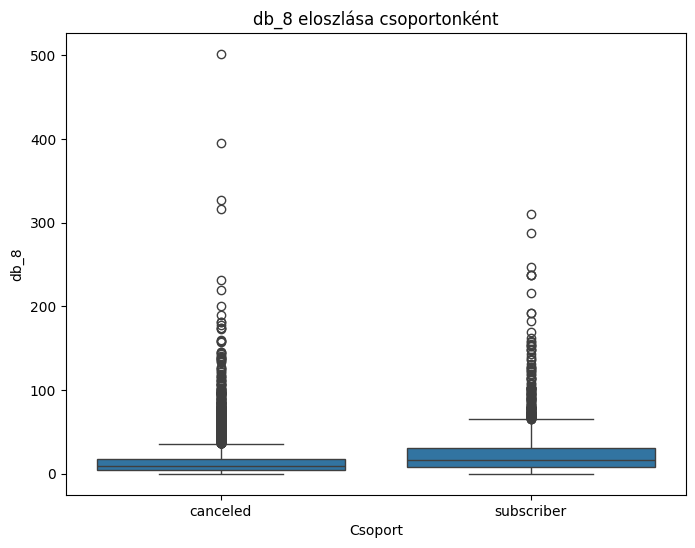

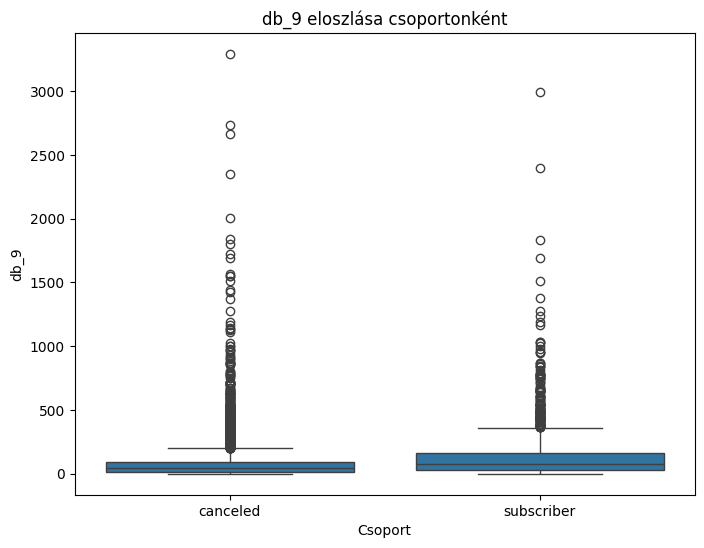

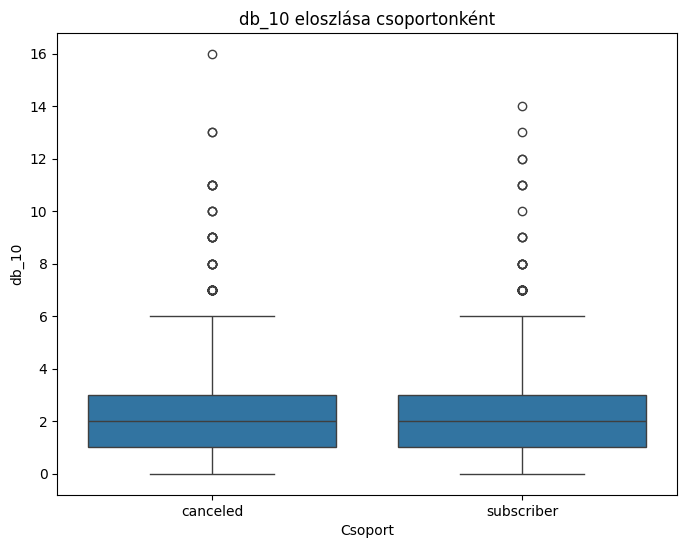

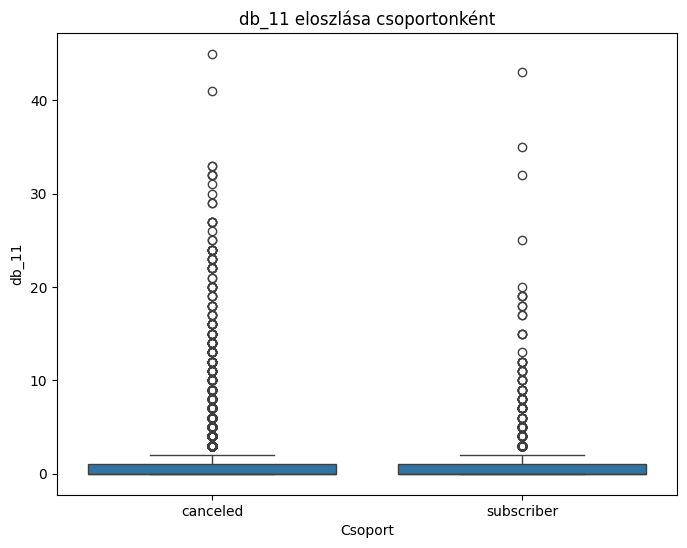

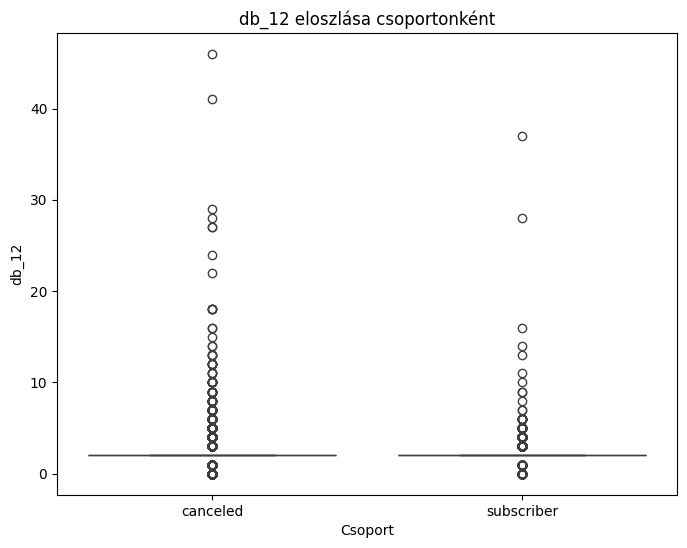

...

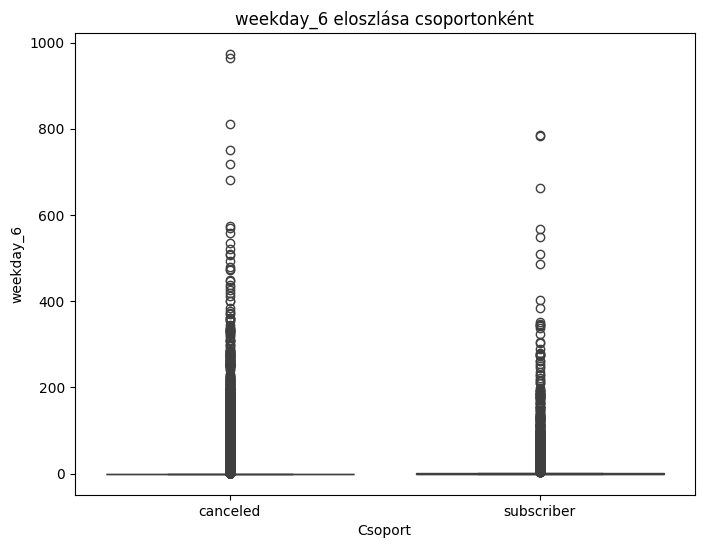

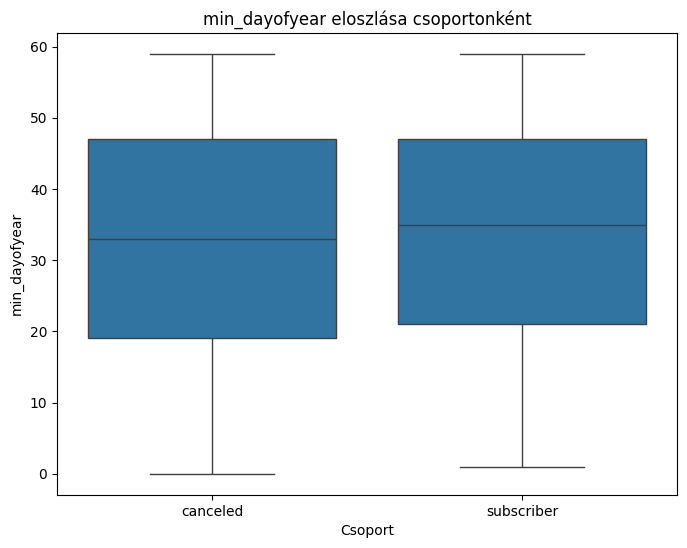

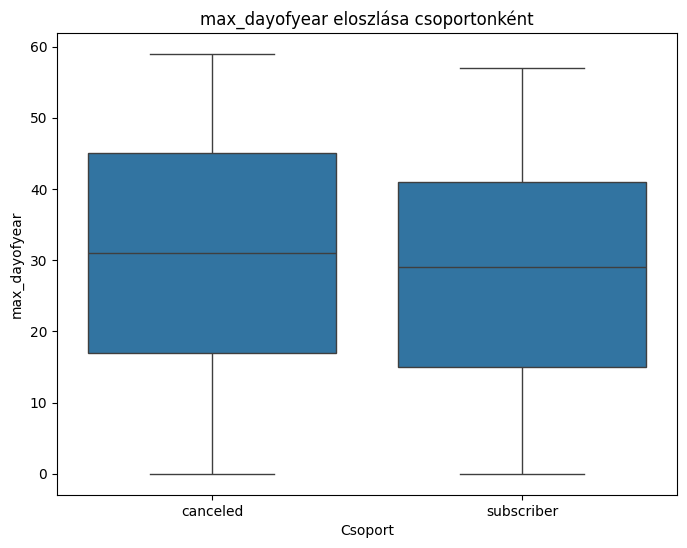

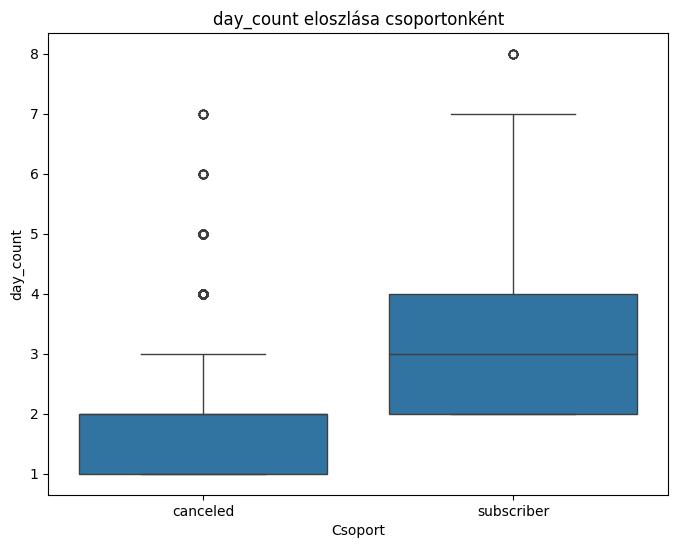

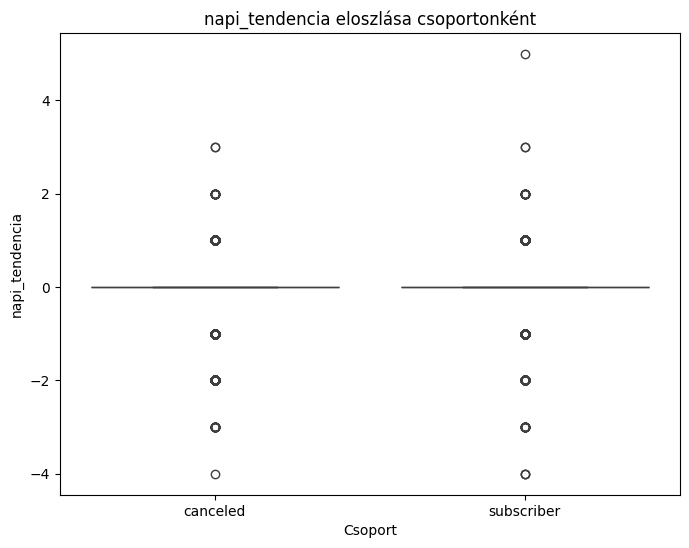

In [67]:
variables = ['db_8','db_9', 'db_10', 'db_11', 'db_12', 'db_13', 'db_140','db_14', 'db_141', 'db_142', 'db_15',
             'darab','db_valodi','time_per_darab', 'time_per_valodi_darab', 'total_time','TIME2','average_time','median_all',
             'median_non_zero','modus_all','modus_non_zero',
             'week_1','week_2','week_3','week_4','week_5',
             'week_6', 'week_7', 'week_8',  'week_9',
             'weekday', 'weekend',
             'weekday_0', 'weekday_1','weekday_2', 'weekday_3',
             'weekday_4',       'weekday_5', 'weekday_6',  'min_dayofyear', 'max_dayofyear',
       'day_count', 'napi_tendencia']
for var in variables:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='subscriber_or_cancelled', y=var, data=df)
    plt.title(f'{var} eloszlása csoportonként')
    plt.xlabel('Csoport')
    plt.ylabel(var)
    plt.show()

In [68]:
#itt csak annyi látszik, hogy a lemondás rejtett szándék (db_13) kicsit erősebb a valóban lemondók között 

In [69]:
crosstab_version = pd.crosstab(df['os_version'], df['subscriber_or_cancelled'])

print(crosstab_version)

subscriber_or_cancelled  canceled  subscriber
os_version                                   
12.2                            0           1
12.5.7                          4           1
14.6                            1           1
15.6                            0           1
15.6.1                          1           0
16.0                           52           2
16.0.1                          1           1
16.0.2                         25           1
16.0.3                         11           0
16.1                           17           2
16.1.1                         76           9
16.1.2                         21           2
16.2                           69           3
16.3                           27           0
16.3.1                         89           6
16.4                            6           0
16.4.1                         14           3
16.5                           21           0
16.5.1                         26           0
16.6                           50 

In [70]:
def main_version(subversion):
    return subversion[:2]

In [71]:
df['os_main_version'] = df['os_version'].apply(main_version)
df['os_main_version'].value_counts()

os_main_version
18    10352
17     2382
16      815
12        6
15        2
14        2
Name: count, dtype: int64

In [72]:
crosstab_version = pd.crosstab(df['os_main_version'], df['subscriber_or_cancelled'])

crosstab_version['sp'] = (crosstab_version['subscriber'] / crosstab_version['subscriber'].sum()) * 100
crosstab_version['cp'] = (crosstab_version['canceled'] / crosstab_version['canceled'].sum()) * 100

crosstab_version

subscriber_or_cancelled,canceled,subscriber,sp,cp
os_main_version,,,,
12,4,2,0.098814,0.034677
14,1,1,0.049407,0.008669
15,1,1,0.049407,0.008669
16,776,39,1.926877,6.727352
17,2167,215,10.622530,18.786303
18,8586,1766,87.252964,74.434330


In [73]:
df

,distinct_id,db_8,db_9,db_10,db_12,db_11,db_13,db_140,db_14,db_142,db_141,db_15,db_8_b,db_9_b,db_10_b,db_11_b,db_12_b,db_13_b,db_140_b,db_14_b,db_141_b,db_142_b,db_15_b,trial,subscriber,canceled,subscriber_or_cancelled,darab,db_valodi,time_per_darab,time_per_valodi_darab,total_time,TIME2,average_time,median_all,median_non_zero,modus_all,modus_non_zero,country_code,country_name,Continent,Population,os_version,week_1,week_2,week_3,week_4,week_5,week_6,week_7,week_8,week_9,weekday_0,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,weekend,weekday,min_dayofyear,max_dayofyear,day_count,napi_tendencia,dayofyear_0,dayofyear_1,dayofyear_2,dayofyear_3,dayofyear_4,dayofyear_5,dayofyear_6,dayofyear_7,dayofyear_8,dayofyear_9,dayofyear_10,dayofyear_11,dayofyear_12,dayofyear_13,dayofyear_14,dayofyear_15,dayofyear_16,dayofyear_17,dayofyear_18,dayofyear_19,dayofyear_20,dayofyear_21,dayofyear_22,dayofyear_23,dayofyear_24,dayofyear_25,dayofyear_26,dayofyear_27,dayofyear_28,dayofyear_29,dayofyear_30,dayofyear_31,dayofyear_32,dayofyear_33,dayofyear_34,dayofyear_35,dayofyear_36,dayofyear_37,dayofyear_38,dayofyear_39,dayofyear_40,dayofyear_41,dayofyear_42,dayofyear_43,dayofyear_44,dayofyear_45,dayofyear_46,dayofyear_47,dayofyear_48,dayofyear_49,dayofyear_50,dayofyear_51,dayofyear_52,dayofyear_53,dayofyear_54,dayofyear_55,dayofyear_56,dayofyear_57,dayofyear_58,dayofyear_59,tmp_0,tmp_1,tmp_2,tmp_3,tmp_4,tmp_5,tmp_6,tmp_7,tmp_8,tmp_9,tmp_10,tmp_11,tmp_12,tmp_13,tmp_14,tmp_15,tmp_16,tmp_17,tmp_18,tmp_19,tmp_20,tmp_21,tmp_22,tmp_23,tmp_24,tmp_25,tmp_26,tmp_27,tmp_28,tmp_29,tmp_30,tmp_31,tmp_32,tmp_33,tmp_34,tmp_35,tmp_36,tmp_37,tmp_38,tmp_39,tmp_40,tmp_41,tmp_42,tmp_43,tmp_44,tmp_45,tmp_46,tmp_47,tmp_48,tmp_49,tmp_50,tmp_51,tmp_52,tmp_53,tmp_54,tmp_55,tmp_56,tmp_57,tmp_58,os_main_version
1,$device:user_00245049429424,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1,0,1,0,0,0,0,0,0,1,0,1,canceled,11,5.0,1738.400000,129.000000,8692,645.0,645.0,645.0,645.0,645.0,645.0,KZ,Kazakhstan,Asia,19196465.0,18.1.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,11.0,49,49,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,18
2,$device:user_00254383447974,3.0,5.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1,0,1,0,0,0,0,0,0,1,0,1,canceled,15,7.0,17.857143,133.142857,125,932.0,932.0,932.0,932.0,932.0,932.0,ID,Indonesia,Asia,273753191.0,18.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,19,19,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,18
3,$device:user_00263171700618,19.0,68.0,4.0,9.0,2.0,2.0,1.0,1.0,0.0,0.0,0.0,1,1,1,1,1,1,1,1,0,0,0,1,0,1,canceled,107,80.0,5373.675000,34.725000,429894,2778.0,2778.0,2778.0,2778.0,2778.0,2778.0,US,United States,North America,336997624.0,18.2,53.0,54.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,2.0,0.0,0.0,46.0,0.0,53.0,53.0,54.0,6,4,4,-2,0.0,0.0,0.0,0.0,53.0,6.0,2.0,0.0,0.0,46.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,-1,-1,-1,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,18
4,$device:user_00300798025250,29.0,156.0,2.0,2.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,1,1,1,1,1,1,0,0,0,0,0,1,0,1,canceled,198,160.0,1485.268750,25.506250,237643,4081.0,4081.0,4081.0

In [74]:
df['country_code'].unique().tolist()

['KZ',
 'ID',
 'US',
 'TW',
 'ES',
 'EE',
 'CA',
 'EC',
 'RO',
 'PT',
 'VN',
 'FI',
 'KE',
 'GR',
 'MD',
 'NL',
 'RU',
 'MZ',
 'DE',
 'CO',
 'FR',
 'MY',
 'KR',
 'HK',
 'NZ',
 'DK',
 'GB',
 'PA',
 'UA',
 'NR',
 'PH',
 'JP',
 'PE',
 'PR',
 'AU',
 'BG',
 'IL',
 'IE',
 'VE',
 'GT',
 'SE',
 'AE',
 'TH',
 'UZ',
 'BR',
 'IT',
 'MX',
 'CN',
 'RS',
 'SK',
 'PL',
 'HU',
 'SN',
 'IN',
 'AM',
 'ZA',
 'SA',
 'BE',
 'DO',
 'NO',
 'BO',
 'NI',
 'TR',
 'AO',
 'MN',
 'VI',
 'MC',
 'AT',
 'CH',
 'NG',
 'CL',
 'LV',
 'IQ',
 'RW',
 'KG',
 'RE',
 'LT',
 'MM',
 'AL',
 'GE',
 'HR',
 'SG',
 'CZ',
 'MO',
 'AR',
 0,
 'TJ',
 'QA',
 'EG',
 'IR',
 'KY',
 'MA',
 'GF',
 'ZM',
 'LR',
 'ZW',
 'TT',
 'AZ',
 'BH',
 'CY',
 'MW',
 'GU',
 'AD',
 'LU',
 'MU',
 'SI',
 'BY',
 'DZ',
 'GP',
 'GH',
 'KW',
 'CR',
 'UG',
 'NP',
 'CW',
 'JO',
 'PY',
 'PK',
 'GM',
 'UY',
 'LB',
 'HN',
 'CI',
 'ME',
 'KH',
 'LY',
 'OM',
 'CD',
 'SV',
 'LK',
 'FJ',
 'JM',
 'BJ',
 'MR',
 'MT',
 'TL',
 'MG',
 'LI',
 'IS',
 'TN',
 'CG',
 'PS',
 'MQ',
 '

In [75]:
crosstab_version = pd.crosstab(df['country_code'], df['subscriber_or_cancelled'])

print(crosstab_version)

subscriber_or_cancelled  canceled  subscriber
country_code                                 
0                               1           0
AD                              1           0
AE                             66          17
AL                              2           1
AM                              6           0
...                           ...         ...
VI                              1           1
VN                             36           0
ZA                             30           2
ZM                              1           0
ZW                              3           0

[147 rows x 2 columns]


In [76]:
df_szurt = df[ df['country_code']==0  ] 
crosstab_tmp = pd.crosstab(df_szurt['darab'], df_szurt['subscriber_or_cancelled'])

print(crosstab_tmp)


subscriber_or_cancelled  canceled
darab                            
13                              1


In [77]:
df_szurt

,distinct_id,db_8,db_9,db_10,db_12,db_11,db_13,db_140,db_14,db_142,db_141,db_15,db_8_b,db_9_b,db_10_b,db_11_b,db_12_b,db_13_b,db_140_b,db_14_b,db_141_b,db_142_b,db_15_b,trial,subscriber,canceled,subscriber_or_cancelled,darab,db_valodi,time_per_darab,time_per_valodi_darab,total_time,TIME2,average_time,median_all,median_non_zero,modus_all,modus_non_zero,country_code,country_name,Continent,Population,os_version,week_1,week_2,week_3,week_4,week_5,week_6,week_7,week_8,week_9,weekday_0,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,weekend,weekday,min_dayofyear,max_dayofyear,day_count,napi_tendencia,dayofyear_0,dayofyear_1,dayofyear_2,dayofyear_3,dayofyear_4,dayofyear_5,dayofyear_6,dayofyear_7,dayofyear_8,dayofyear_9,dayofyear_10,dayofyear_11,dayofyear_12,dayofyear_13,dayofyear_14,dayofyear_15,dayofyear_16,dayofyear_17,dayofyear_18,dayofyear_19,dayofyear_20,dayofyear_21,dayofyear_22,dayofyear_23,dayofyear_24,dayofyear_25,dayofyear_26,dayofyear_27,dayofyear_28,dayofyear_29,dayofyear_30,dayofyear_31,dayofyear_32,dayofyear_33,dayofyear_34,dayofyear_35,dayofyear_36,dayofyear_37,dayofyear_38,dayofyear_39,dayofyear_40,dayofyear_41,dayofyear_42,dayofyear_43,dayofyear_44,dayofyear_45,dayofyear_46,dayofyear_47,dayofyear_48,dayofyear_49,dayofyear_50,dayofyear_51,dayofyear_52,dayofyear_53,dayofyear_54,dayofyear_55,dayofyear_56,dayofyear_57,dayofyear_58,dayofyear_59,tmp_0,tmp_1,tmp_2,tmp_3,tmp_4,tmp_5,tmp_6,tmp_7,tmp_8,tmp_9,tmp_10,tmp_11,tmp_12,tmp_13,tmp_14,tmp_15,tmp_16,tmp_17,tmp_18,tmp_19,tmp_20,tmp_21,tmp_22,tmp_23,tmp_24,tmp_25,tmp_26,tmp_27,tmp_28,tmp_29,tmp_30,tmp_31,tmp_32,tmp_33,tmp_34,tmp_35,tmp_36,tmp_37,tmp_38,tmp_39,tmp_40,tmp_41,tmp_42,tmp_43,tmp_44,tmp_45,tmp_46,tmp_47,tmp_48,tmp_49,tmp_50,tmp_51,tmp_52,tmp_53,tmp_54,tmp_55,tmp_56,tmp_57,tmp_58,os_main_version
1354,$device:user_48376190646956,2.0,6.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,1,0,0,1,1,0,0,0,0,0,1,0,1,canceled,13,9.0,13.444444,8.666667,121,78.0,78.0,78.0,78.0,78.0,78.0,0,0,0,0.0,18.3.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.0,0.0,13.0,0.0,0.0,0.0,0.0,0.0,0.0,13.0,55,55,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,18


In [78]:
crosstab_tmp = pd.crosstab(df['Continent'], df['subscriber_or_cancelled'])
crosstab_tmp['subscriber_perc'] = (crosstab_tmp['subscriber'] / crosstab_tmp['subscriber'].sum()) * 100
crosstab_tmp['cancelled_perc'] = (crosstab_tmp['canceled'] / crosstab_tmp['canceled'].sum()) * 100
crosstab_tmp

subscriber_or_cancelled,canceled,subscriber,subscriber_perc,cancelled_perc
Continent,,,,
0,1,0,0.000000,0.008669
Africa,125,12,0.592885,1.083658
Asia,4284,193,9.535573,37.139142
Europe,3401,385,19.021739,29.484179
North America,2819,1248,61.660079,24.438665
Oceania,250,83,4.100791,2.167317
South America,655,103,5.088933,5.678370


In [79]:
df_export = df[['distinct_id', 'country_code', 'subscriber_or_cancelled', 'Continent', 'country_name', 'Population']]
df_export

,distinct_id,country_code,subscriber_or_cancelled,Continent,country_name,Population
1,$device:user_00245049429424,KZ,canceled,Asia,Kazakhstan,19196465.0
2,$device:user_00254383447974,ID,canceled,Asia,Indonesia,273753191.0
3,$device:user_00263171700618,US,canceled,North America,United States,336997624.0
4,$device:user_00300798025250,ID,canceled,Asia,Indonesia,273753191.0
5,$device:user_00416207254977,ID,canceled,Asia,Indonesia,273753191.0
...,...,...,...,...,...,...
19047,user_87804197807747,ES,canceled,Europe,Spain,47486935.0
19048,user_89856855621297,US,subscriber,North America,United States,336997624.0
19052,user_94214979502802,ID,canceled,Asia,Indonesia,273753191.0
19053,user_97547717625156,ID,canceled,Asia,Indonesia,273753191.0


In [80]:
df_export.to_excel('.\country_continent.xlsx')

In [81]:
133/195*100


68.2051282051282

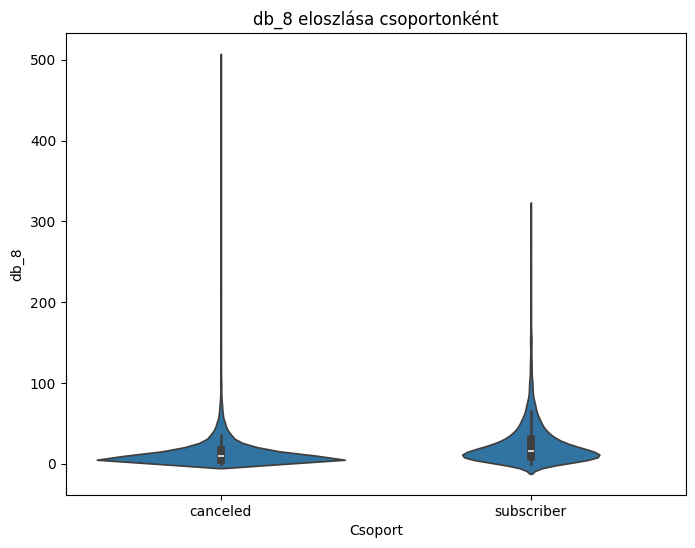

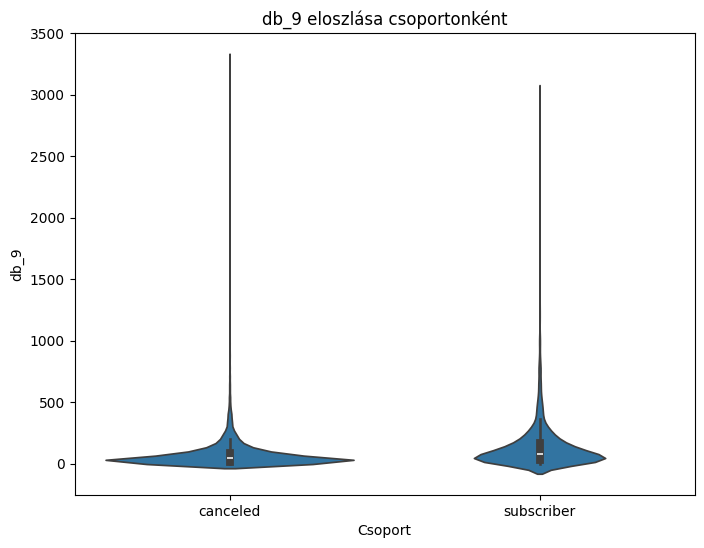

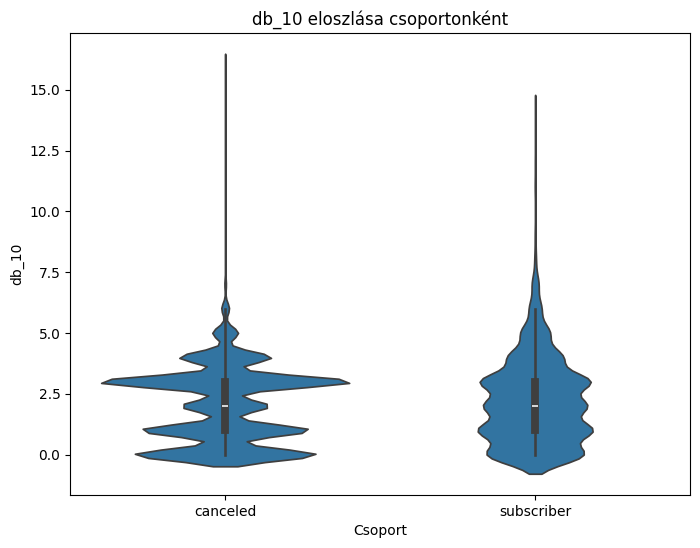

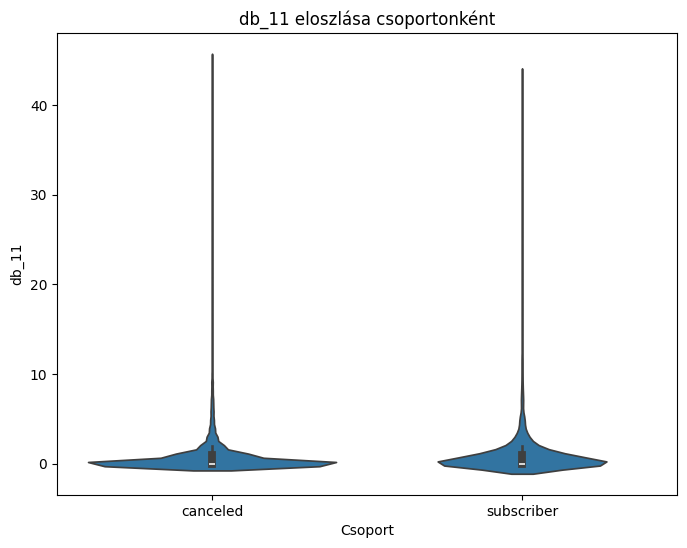

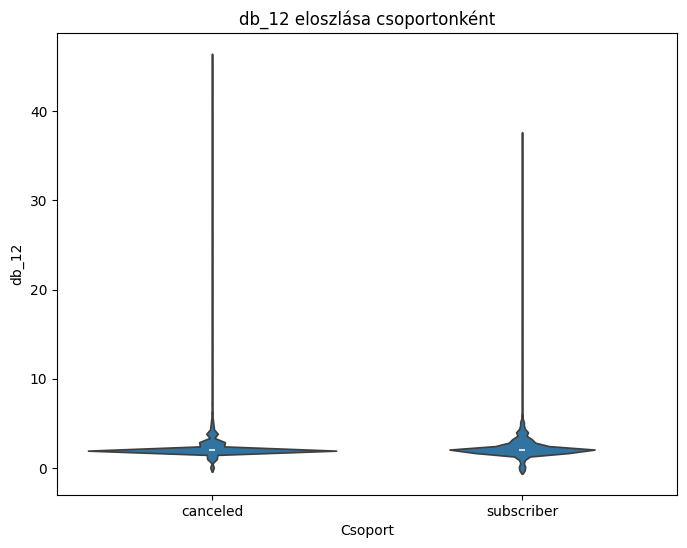

...

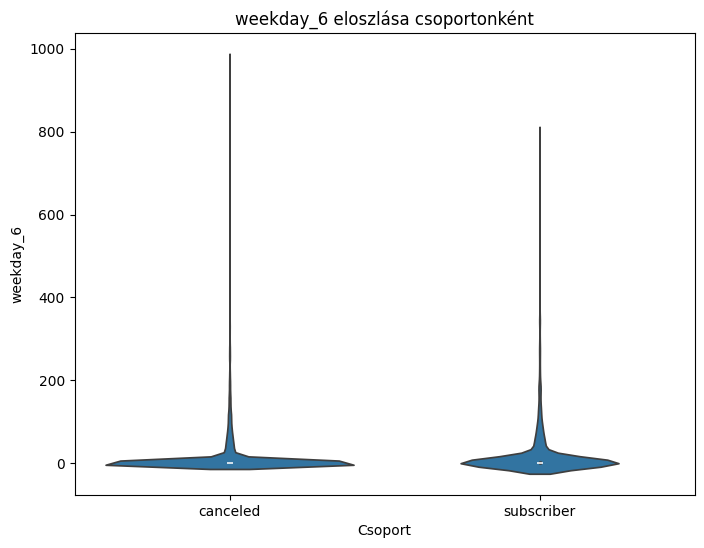

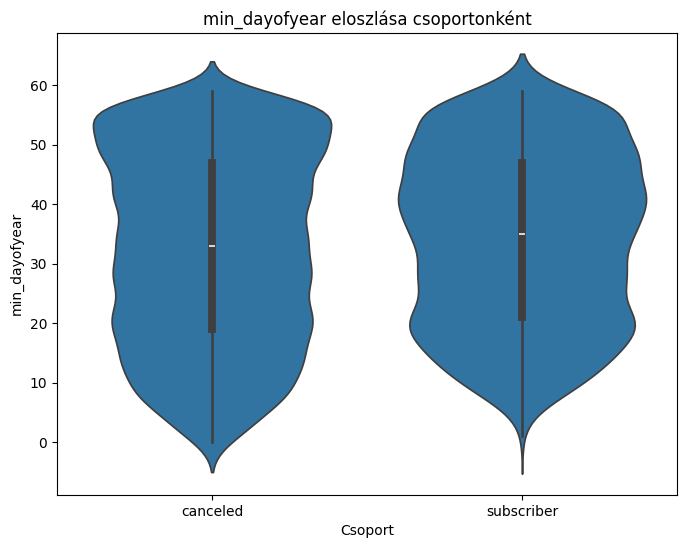

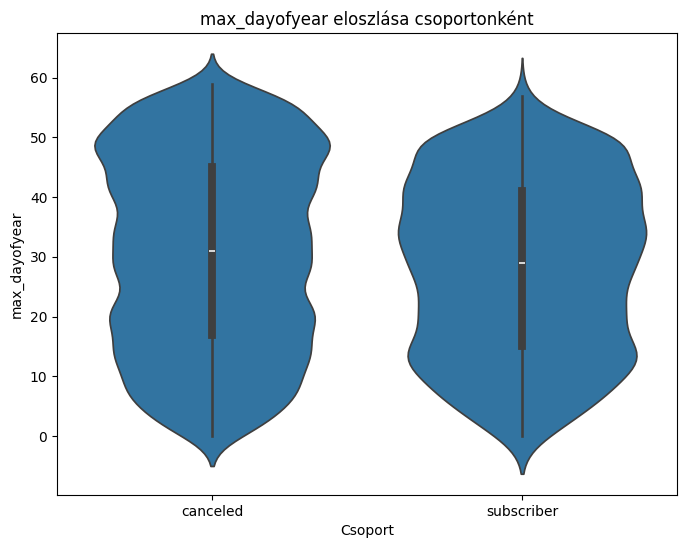

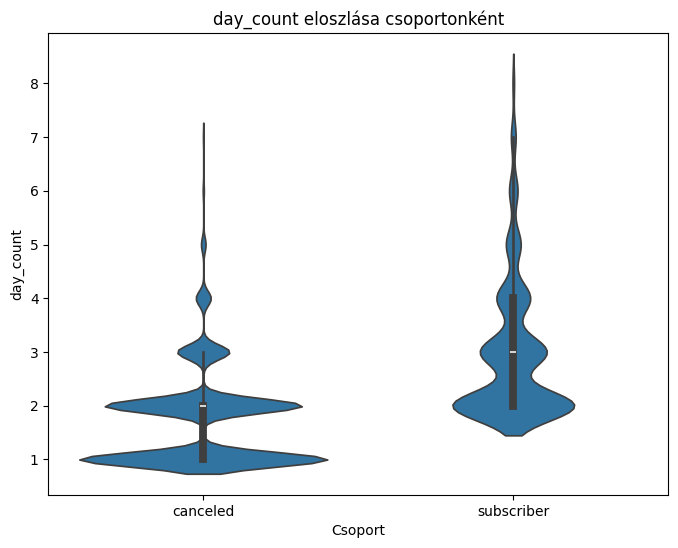

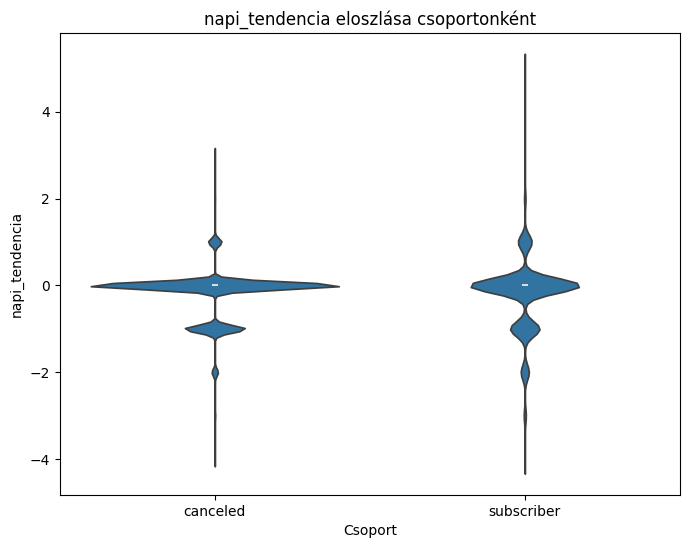

In [82]:
for var in variables:
    plt.figure(figsize=(8, 6))
    sns.violinplot(x='subscriber_or_cancelled', y=var, data=df)
    plt.title(f'{var} eloszlása csoportonként')
    plt.xlabel('Csoport')
    plt.ylabel(var)
    plt.show()

In [83]:
#ez nagyon érdekes, de alig hámozható ki belőle valami

In [84]:
variables

['db_8',
 'db_9',
 'db_10',
 'db_11',
 'db_12',
 'db_13',
 'db_140',
 'db_14',
 'db_141',
 'db_142',
 'db_15',
 'darab',
 'db_valodi',
 'time_per_darab',
 'time_per_valodi_darab',
 'total_time',
 'TIME2',
 'average_time',
 'median_all',
 'median_non_zero',
 'modus_all',
 'modus_non_zero',
 'week_1',
 'week_2',
 'week_3',
 'week_4',
 'week_5',
 'week_6',
 'week_7',
 'week_8',
 'week_9',
 'weekday',
 'weekend',
 'weekday_0',
 'weekday_1',
 'weekday_2',
 'weekday_3',
 'weekday_4',
 'weekday_5',
 'weekday_6',
 'min_dayofyear',
 'max_dayofyear',
 'day_count',
 'napi_tendencia']

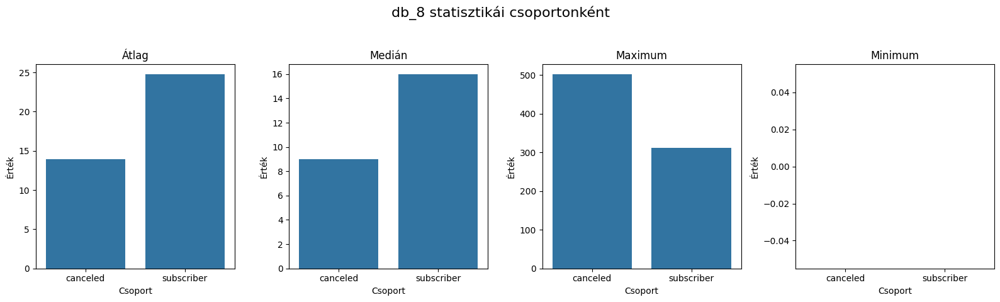

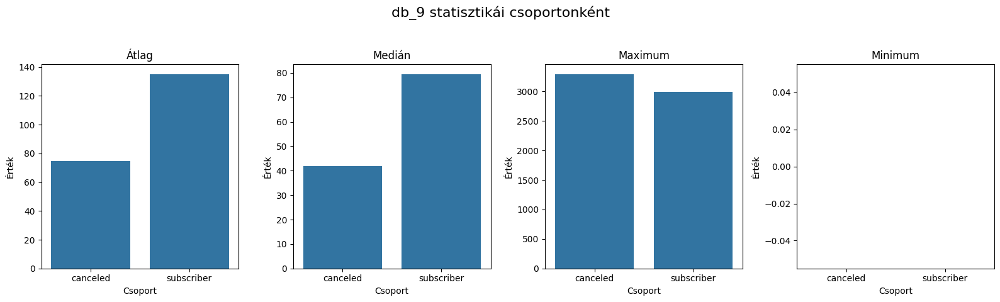

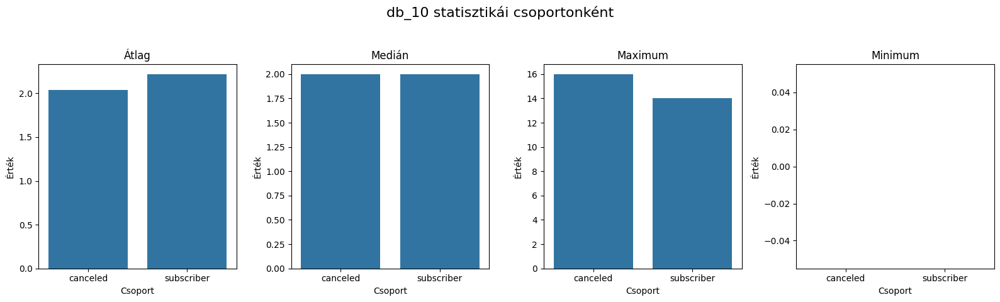

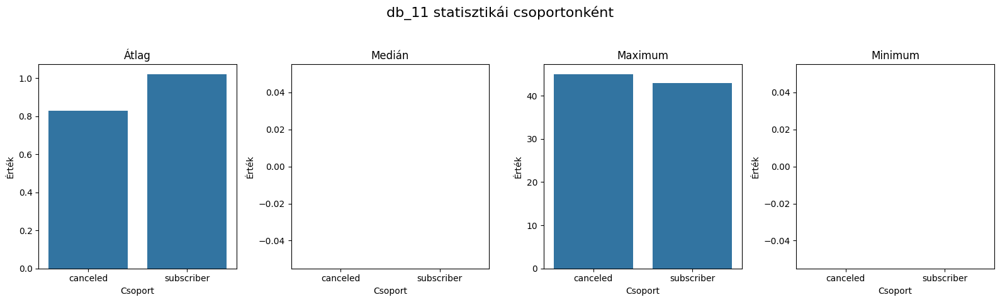

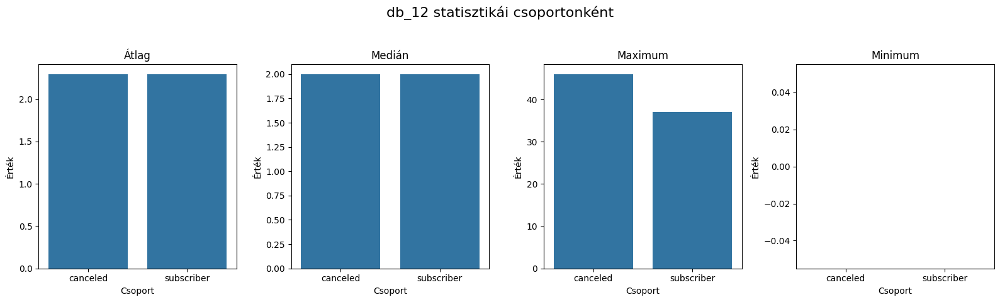

...

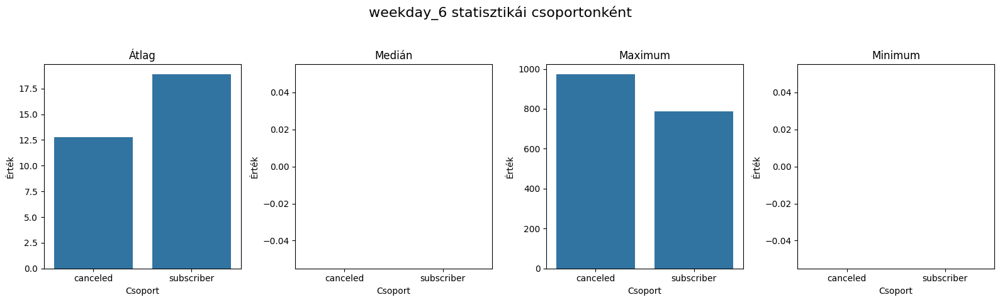

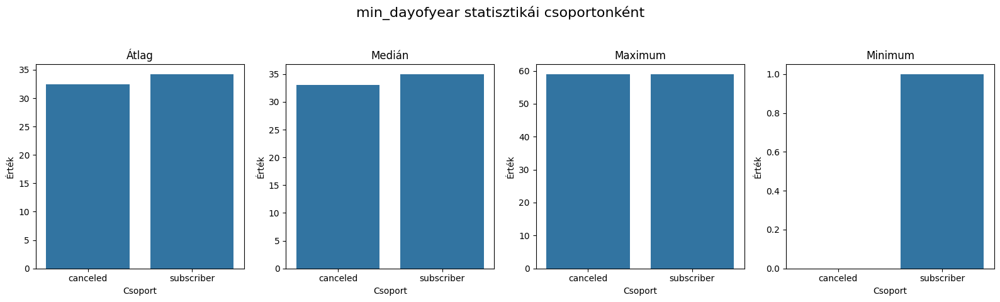

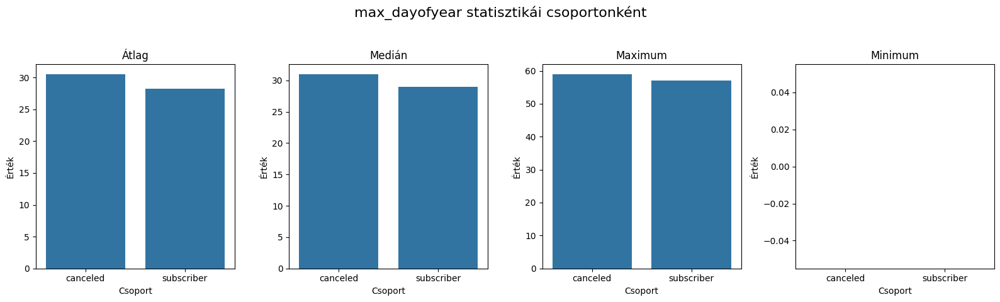

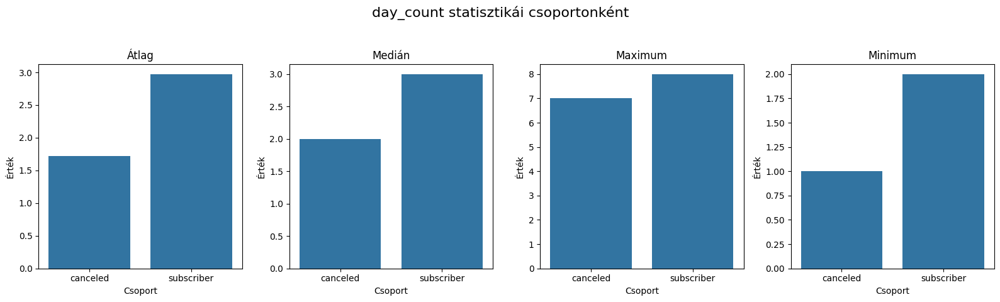

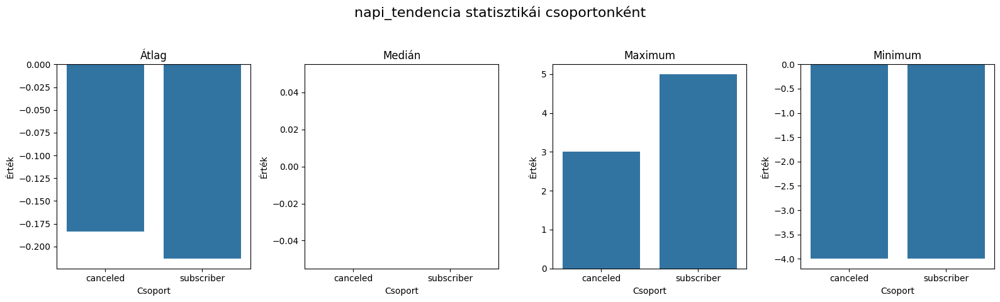

In [85]:
for var in variables:
    grouped_stats = df.groupby('subscriber_or_cancelled')[var].agg(['mean', 'median', 'max', 'min']).reset_index()

    fig, axes = plt.subplots(1, 4, figsize=(16, 5))
    fig.suptitle(f'{var} statisztikái csoportonként', fontsize=16)
    
    # Átlag ábrázolása
    sns.barplot(x='subscriber_or_cancelled', y='mean', data=grouped_stats, ax=axes[0])
    axes[0].set_title('Átlag')
    axes[0].set_xlabel('Csoport')
    axes[0].set_ylabel('Érték')
    
    # Medián ábrázolása
    sns.barplot(x='subscriber_or_cancelled', y='median', data=grouped_stats, ax=axes[1])
    axes[1].set_title('Medián')
    axes[1].set_xlabel('Csoport')
    axes[1].set_ylabel('Érték')
    
    # Maximum ábrázolása
    sns.barplot(x='subscriber_or_cancelled', y='max', data=grouped_stats, ax=axes[2])
    axes[2].set_title('Maximum')
    axes[2].set_xlabel('Csoport')
    axes[2].set_ylabel('Érték')
    
    # Minimum ábrázolása
    sns.barplot(x='subscriber_or_cancelled', y='min', data=grouped_stats, ax=axes[3])
    axes[3].set_title('Minimum')
    axes[3].set_xlabel('Csoport')
    axes[3].set_ylabel('Érték')
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # A címnek hagy helyet
    plt.show()

In [86]:
#db_8/9 kicsit aktivabbak azok akik felhasználóvá válnak. najó sokkal aktívabbak
#db_13 a lemondás rejtett számdék sokkal erősebb azoknál akit aztán ténylegesen lemondók lesznek
#db_140 extra szolgáltatás kb 2x több az előfizetőknél mint a lemondottaknál - nagyon erős változó
#db_15 a motiváció kicsit számít
#db_valódi: kb 2x annyi tevékenységet végeznek az előfizetők
#time_per_valodi_darab: valós eltöltött időben kevesebb interakció jut az előfizetőkre. ez kb azt jelenti, hogy edukálni kell a felmondókat. 

In [87]:
pivot_df = df.pivot_table( columns='subscriber_or_cancelled', values=['weekend','weekday'], aggfunc='sum')
pivot_df['subscriber_%'] = (pivot_df['subscriber'] /pivot_df['subscriber'].sum()  )*100 
pivot_df['cancelled_%'] = ( pivot_df['canceled'] /pivot_df['canceled'].sum() ) *100 
pivot_df['subscriber_%2'] = (pivot_df['subscriber'] /df['subscriber'].sum()  ) 
pivot_df['cancelled_%2'] = ( pivot_df['canceled'] /df['canceled'].sum() ) 
pivot_df

subscriber_or_cancelled,canceled,subscriber,subscriber_%,cancelled_%,subscriber_%2,cancelled_%2
weekday,863250.0,272981.0,79.084354,76.614088,134.872036,74.837451
weekend,263501.0,72196.0,20.915646,23.385912,35.669960,22.843606


In [88]:
df['weekend_per_day'] = df['weekend']/2
df['weekday_per_day'] = df['weekday']/5


In [89]:
pivot_df = df.pivot_table( columns='subscriber_or_cancelled', values=['weekend_per_day','weekday_per_day'], aggfunc='sum')
pivot_df['subscriber_%'] = (pivot_df['subscriber'] /pivot_df['subscriber'].sum()  )*100 
pivot_df['cancelled_%'] = ( pivot_df['canceled'] /pivot_df['canceled'].sum() ) *100 
pivot_df['subscriber_%2'] = (pivot_df['subscriber'] /df['subscriber'].sum()  ) 
pivot_df['cancelled_%2'] = ( pivot_df['canceled'] /df['canceled'].sum() ) 
pivot_df

subscriber_or_cancelled,canceled,subscriber,subscriber_%,cancelled_%,subscriber_%2,cancelled_%2
weekday_per_day,172650.0,54596.2,60.198116,56.718041,26.974407,14.967490
weekend_per_day,131750.5,36098.0,39.801884,43.281959,17.834980,11.421803


In [90]:
272981.0/134.872036	

2023.9999935939277

In [91]:
pivot_df = df.pivot_table( columns='subscriber_or_cancelled', values=['weekday_0','weekday_1','weekday_2','weekday_3','weekday_4','weekday_5','weekday_6'], aggfunc='sum')
pivot_df['subscriber_%'] = (pivot_df['subscriber'] /pivot_df['subscriber'].sum()  )*100 
pivot_df['cancelled_%'] = ( pivot_df['canceled'] /pivot_df['canceled'].sum() ) *100
pivot_df['subscriber_%2'] = (pivot_df['subscriber'] /df['subscriber'].sum()  ) 
pivot_df['cancelled_%2'] = ( pivot_df['canceled'] /df['canceled'].sum() ) 
pivot_df

subscriber_or_cancelled,canceled,subscriber,subscriber_%,cancelled_%,subscriber_%2,cancelled_%2
weekday_0,161960.0,58011.0,16.806160,14.374072,28.661561,14.040746
weekday_1,177800.0,55049.0,15.948050,15.779884,27.198123,15.413958
weekday_2,179059.0,57106.0,16.543976,15.891621,28.214427,15.523104
weekday_3,189238.0,58121.0,16.838028,16.795015,28.715909,16.405548
weekday_4,155193.0,44694.0,12.948140,13.773496,22.082016,13.454096
weekday_5,116512.0,33930.0,9.829740,10.340528,16.763834,10.100737
weekday_6,146989.0,38266.0,11.085907,13.045384,18.906126,12.742870


In [92]:
100/7*5


71.42857142857143

In [93]:
33930.0+38266.0

72196.0

In [94]:
df.columns

Index(['distinct_id', 'db_8', 'db_9', 'db_10', 'db_12', 'db_11', 'db_13',
       'db_140', 'db_14', 'db_142',
       ...
       'tmp_52', 'tmp_53', 'tmp_54', 'tmp_55', 'tmp_56', 'tmp_57', 'tmp_58',
       'os_main_version', 'weekend_per_day', 'weekday_per_day'],
      dtype='object', length=187)

In [95]:
import pandas as pd
from scipy import stats

#searc_col = ['db_8','db_9', 'db_10', 'db_11', 'db_12', 'db_13', 'db_140','db_14','db_15', 'db_141', 'db_142']

for var in variables:
    subscriber_group = df[df['subscriber_or_cancelled'] == 'subscriber'][var]
    cancelled_group = df[df['subscriber_or_cancelled'] == 'canceled'][var]

    # Független mintás t-próba elvégzése
    if len(subscriber_group) > 0 and len(cancelled_group) > 0:
        t_stat, p_value = stats.ttest_ind(subscriber_group, cancelled_group)
    
        alpha = 0.05
        if p_value < alpha:
            print("{}: szignifikáns (p < {}).".format(var,alpha))
        else:
            print("{}: nem szignifikáns (p >= {}).".format(var,alpha))
    else:
        print("Nem elegendő adat egyik vagy mindkét csoportban a t-próba elvégzéséhez.")

db_8: szignifikáns (p < 0.05).
db_9: szignifikáns (p < 0.05).
db_10: szignifikáns (p < 0.05).
db_11: szignifikáns (p < 0.05).
db_12: nem szignifikáns (p >= 0.05).
db_13: szignifikáns (p < 0.05).
db_140: szignifikáns (p < 0.05).
db_14: szignifikáns (p < 0.05).
db_141: szignifikáns (p < 0.05).
db_142: nem szignifikáns (p >= 0.05).
db_15: szignifikáns (p < 0.05).
darab: szignifikáns (p < 0.05).
db_valodi: szignifikáns (p < 0.05).
time_per_darab: szignifikáns (p < 0.05).
time_per_valodi_darab: szignifikáns (p < 0.05).
total_time: szignifikáns (p < 0.05).
TIME2: szignifikáns (p < 0.05).
average_time: szignifikáns (p < 0.05).
median_all: szignifikáns (p < 0.05).
median_non_zero: szignifikáns (p < 0.05).
modus_all: szignifikáns (p < 0.05).
modus_non_zero: szignifikáns (p < 0.05).
week_1: szignifikáns (p < 0.05).
week_2: szignifikáns (p < 0.05).
week_3: szignifikáns (p < 0.05).
week_4: szignifikáns (p < 0.05).
week_5: szignifikáns (p < 0.05).
week_6: szignifikáns (p < 0.05).
week_7: szignifiká

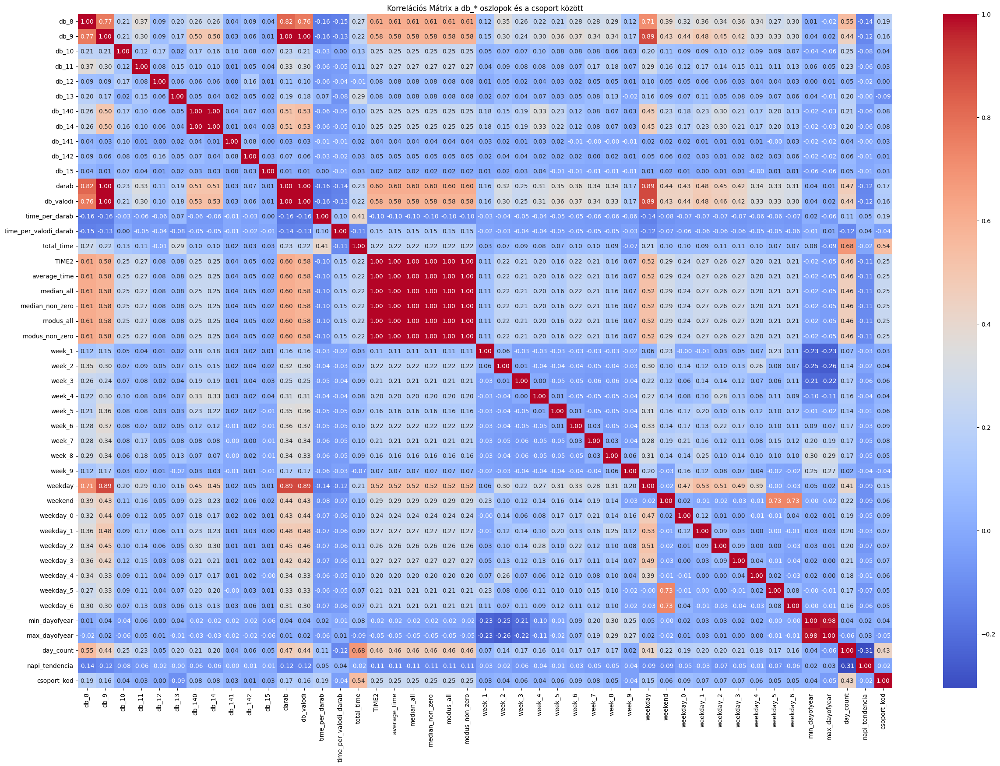

In [96]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

#Kategorikus oszlop numerikus kódolása (integer kódolás)
df['csoport_kod'] = df['subscriber_or_cancelled'].astype('category').cat.codes

oszlopok = ['db_10', 'db_11', 'db_12', 'db_13', 'db_140', 'db_14', 'db_15', 'db_141', 'db_142', 'csoport_kod', 'TIME2']
oszlopok = variables + ['csoport_kod']
kor_df = df[oszlopok]

korrelacios_matrix = kor_df.corr(method='pearson')

plt.figure(figsize=(30, 20))
sns.heatmap(korrelacios_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Korrelációs Mátrix a db_* oszlopok és a csoport között')
plt.show()

In [97]:
#kutya gumi sem látszik, de nem is vártam nagyon....
#kb a darabszámok és az idők egyíüttmozognak
#ami érdekes egyedül, hogy minél nagyobb a day_count, anáál kisebb a tendencia, tehát ha több napon keresztül csinálják, akkor naponta egyre kevesebb az interakció...

In [98]:
df_export = df[['distinct_id','total_time', 'darab', 'TIME2','average_time',
       'median_all', 'median_non_zero', 'modus_all', 'modus_non_zero',
       'db_valodi', 'time_per_darab', 'time_per_valodi_darab','subscriber_or_cancelled']]
df_export.to_excel('.\time_data.xlsx')

In [99]:
df = df.reset_index()
df

,index,distinct_id,db_8,db_9,db_10,db_12,db_11,db_13,db_140,db_14,db_142,db_141,db_15,db_8_b,db_9_b,db_10_b,db_11_b,db_12_b,db_13_b,db_140_b,db_14_b,db_141_b,db_142_b,db_15_b,trial,subscriber,canceled,subscriber_or_cancelled,darab,db_valodi,time_per_darab,time_per_valodi_darab,total_time,TIME2,average_time,median_all,median_non_zero,modus_all,modus_non_zero,country_code,country_name,Continent,Population,os_version,week_1,week_2,week_3,week_4,week_5,week_6,week_7,week_8,week_9,weekday_0,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,weekend,weekday,min_dayofyear,max_dayofyear,day_count,napi_tendencia,dayofyear_0,dayofyear_1,dayofyear_2,dayofyear_3,dayofyear_4,dayofyear_5,dayofyear_6,dayofyear_7,dayofyear_8,dayofyear_9,dayofyear_10,dayofyear_11,dayofyear_12,dayofyear_13,dayofyear_14,dayofyear_15,dayofyear_16,dayofyear_17,dayofyear_18,dayofyear_19,dayofyear_20,dayofyear_21,dayofyear_22,dayofyear_23,dayofyear_24,dayofyear_25,dayofyear_26,dayofyear_27,dayofyear_28,dayofyear_29,dayofyear_30,dayofyear_31,dayofyear_32,dayofyear_33,dayofyear_34,dayofyear_35,dayofyear_36,dayofyear_37,dayofyear_38,dayofyear_39,dayofyear_40,dayofyear_41,dayofyear_42,dayofyear_43,dayofyear_44,dayofyear_45,dayofyear_46,dayofyear_47,dayofyear_48,dayofyear_49,dayofyear_50,dayofyear_51,dayofyear_52,dayofyear_53,dayofyear_54,dayofyear_55,dayofyear_56,dayofyear_57,dayofyear_58,dayofyear_59,tmp_0,tmp_1,tmp_2,tmp_3,tmp_4,tmp_5,tmp_6,tmp_7,tmp_8,tmp_9,tmp_10,tmp_11,tmp_12,tmp_13,tmp_14,tmp_15,tmp_16,tmp_17,tmp_18,tmp_19,tmp_20,tmp_21,tmp_22,tmp_23,tmp_24,tmp_25,tmp_26,tmp_27,tmp_28,tmp_29,tmp_30,tmp_31,tmp_32,tmp_33,tmp_34,tmp_35,tmp_36,tmp_37,tmp_38,tmp_39,tmp_40,tmp_41,tmp_42,tmp_43,tmp_44,tmp_45,tmp_46,tmp_47,tmp_48,tmp_49,tmp_50,tmp_51,tmp_52,tmp_53,tmp_54,tmp_55,tmp_56,tmp_57,tmp_58,os_main_version,weekend_per_day,weekday_per_day,csoport_kod
0,1,$device:user_00245049429424,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1,0,1,0,0,0,0,0,0,1,0,1,canceled,11,5.0,1738.400000,129.000000,8692,645.0,645.0,645.0,645.0,645.0,645.0,KZ,Kazakhstan,Asia,19196465.0,18.1.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,11.0,49,49,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,18,0.0,2.2,0
1,2,$device:user_00254383447974,3.0,5.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1,0,1,0,0,0,0,0,0,1,0,1,canceled,15,7.0,17.857143,133.142857,125,932.0,932.0,932.0,932.0,932.0,932.0,ID,Indonesia,Asia,273753191.0,18.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,19,19,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,18,0.0,3.0,0
2,3,$device:user_00263171700618,19.0,68.0,4.0,9.0,2.0,2.0,1.0,1.0,0.0,0.0,0.0,1,1,1,1,1,1,1,1,0,0,0,1,0,1,canceled,107,80.0,5373.675000,34.725000,429894,2778.0,2778.0,2778.0,2778.0,2778.0,2778.0,US,United States,North America,336997624.0,18.2,53.0,54.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,2.0,0.0,0.0,46.0,0.0,53.0,53.0,54.0,6,4,4,-2,0.0,0.0,0.0,0.0,53.0,6.0,2.0,0.0,0.0,46.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,-1,-1,-1,0,1,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,18,26.5,10.8,0
3,4,$device:user_00300798025250,29.0,156.0,2.0,2.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,1,1,1,

In [100]:
scaler = StandardScaler()
standard_data = scaler.fit_transform(df[variables])
standard_variables = [f'{col}_scaled' for col in variables]


standardizalt_df = pd.DataFrame(standard_data, columns=standard_variables)

standardizalt_df


,db_8_scaled,db_9_scaled,db_10_scaled,db_11_scaled,db_12_scaled,db_13_scaled,db_140_scaled,db_14_scaled,db_141_scaled,db_142_scaled,db_15_scaled,darab_scaled,db_valodi_scaled,time_per_darab_scaled,time_per_valodi_darab_scaled,total_time_scaled,TIME2_scaled,average_time_scaled,median_all_scaled,median_non_zero_scaled,modus_all_scaled,modus_non_zero_scaled,week_1_scaled,week_2_scaled,week_3_scaled,week_4_scaled,week_5_scaled,week_6_scaled,week_7_scaled,week_8_scaled,week_9_scaled,weekday_scaled,weekend_scaled,weekday_0_scaled,weekday_1_scaled,weekday_2_scaled,weekday_3_scaled,weekday_4_scaled,weekday_5_scaled,weekday_6_scaled,min_dayofyear_scaled,max_dayofyear_scaled,day_count_scaled,napi_tendencia_scaled
0,-0.729972,-0.594441,0.580740,-0.355191,-0.221202,-0.547084,-0.235009,-0.230661,-0.038954,-0.122072,-0.094731,-0.623783,-0.595572,-0.300599,0.144082,-0.910805,-0.549993,-0.549993,-0.549993,-0.549993,-0.549993,-0.549993,-0.135015,-0.183828,-0.228028,-0.210558,-0.215193,-0.214705,-0.245602,-0.074477,-0.171573,-0.518437,-0.346672,-0.277118,-0.282250,-0.104841,-0.310626,-0.283515,-0.227891,-0.280952,1.019792,1.174342,-0.873378,0.322415
1,-0.629506,-0.579729,0.580740,-0.355191,-0.221202,-0.547084,-0.235009,-0.230661,-0.038954,-0.122072,-0.094731,-0.598206,-0.581236,-0.383666,0.159466,-0.943996,-0.480649,-0.480649,-0.480649,-0.480649,-0.480649,-0.480649,-0.135015,-0.183828,-0.228028,0.032862,-0.215193,-0.214705,-0.245602,-0.241937,-0.171573,-0.489951,-0.346672,-0.020895,-0.282250,-0.284543,-0.310626,-0.283515,-0.227891,-0.280952,-0.855265,-0.698809,-0.873378,0.322415
2,0.174225,-0.116289,1.203162,0.472306,5.083240,1.674512,-0.077395,-0.072641,-0.038954,-0.122072,-0.094731,-0.009957,-0.057948,-0.125092,-0.206009,0.721038,-0.034623,-0.034623,-0.034623,-0.034623,-0.034623,-0.034623,1.455823,0.689852,-0.228028,-0.210558,-0.215193,-0.214705,-0.245602,-0.241937,-0.171573,-0.212213,0.395449,-0.174629,-0.249379,-0.284543,-0.310626,0.601146,-0.227891,0.808895,-1.667790,-1.635384,2.010960,-3.110351
3,0.676556,0.531055,-0.041681,1.713552,-0.221202,1.674512,-0.235009,-0.230661,-0.038954,-0.122072,-0.094731,0.571898,0.515518,-0.312820,-0.240243,-0.023791,0.280204,0.280204,0.280204,0.280204,0.280204,0.280204,-0.135015,3.019667,-0.228028,-0.210558,-0.215193,-0.214705,-0.245602,-0.241937,-0.171573,0.813281,-0.346672,-0.277118,2.955575,-0.284543,-0.293599,-0.283515,-0.227891,-0.280952,-1.542786,-1.510507,0.088068,0.322415
4,-0.026708,0.067615,0.580740,-0.355191,0.536575,0.563714,-0.235009,-0.230661,-0.038954,-0.122072,-0.094731,0.053983,0.063914,-0.083468,-0.264021,1.398963,-0.258119,-0.258119,-0.258119,-0.258119,-0.258119,-0.258119,-0.135015,-0.183828,-0.228028,1.655662,-0.185548,-0.214705,-0.245602,-0.241937,-0.171573,0.236440,-0.346672,-0.277118,1.574979,-0.219197,-0.310626,-0.283515,-0.227891,-0.280952,-0.355250,-0.636370,1.049514,-1.393968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13554,-0.729972,-0.513523,0.580740,-0.355191,-0.221202,-0.547084,-0.235009,-0.230661,-0.038954,-0.122072,-0.094731,-0.553448,-0.516721,-0.097343,-0.141162,-0.575748,-0.504086,-0.504086,-0.504086,-0.504086,-0.504086,-0.504086,0.495317,-0.167649,-0.228028,-0.210558,-0.215193,-0.214705,-0.245602,-0.241937,-0.171573,-0.589652,-0.052624,-0.260036,-0.282250,-0.284543,-0.310626,-0.283515,-0.227891,0.150874,-1.730292,-1.635384,0.088068,-1.393968
13555,-0.428573,-0.506167,0.580740,-0.355191,-0.221202,-0.547084,-0.235009,-0.230661,-0.038954,-0.122072,-0.094731,-0.508690,-0.509552,1.251371,0.159591,1.287214,-0.158815,-0.158815,-0.158815,-0.158815,-0.158815,-0.158815,-0.135015,-0.183828,0.278482,-0.194330,-0.215193,-0.214705,-0.245602,-0.241937,-0.171573,-0.390251,-0.346672,0.218247,-0.282250,-0.284543,-0.310626,-0.283515,-0.227891,-0.280952,-0.855265,-1.135877,0.088068,0.322415
13556,0.274691,0.185314,1.203162,-0.355191,-0.221202,0.563714,-0.2

In [101]:
df2 = pd.concat([df, standardizalt_df], axis=1)
df2

,index,distinct_id,db_8,db_9,db_10,db_12,db_11,db_13,db_140,db_14,db_142,db_141,db_15,db_8_b,db_9_b,db_10_b,db_11_b,db_12_b,db_13_b,db_140_b,db_14_b,db_141_b,db_142_b,db_15_b,trial,subscriber,canceled,subscriber_or_cancelled,darab,db_valodi,time_per_darab,time_per_valodi_darab,total_time,TIME2,average_time,median_all,median_non_zero,modus_all,modus_non_zero,country_code,country_name,Continent,Population,os_version,week_1,week_2,week_3,week_4,week_5,week_6,week_7,week_8,week_9,weekday_0,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,weekend,weekday,min_dayofyear,max_dayofyear,day_count,napi_tendencia,dayofyear_0,dayofyear_1,dayofyear_2,dayofyear_3,dayofyear_4,dayofyear_5,dayofyear_6,dayofyear_7,dayofyear_8,dayofyear_9,dayofyear_10,dayofyear_11,dayofyear_12,dayofyear_13,dayofyear_14,dayofyear_15,dayofyear_16,dayofyear_17,dayofyear_18,dayofyear_19,dayofyear_20,dayofyear_21,dayofyear_22,dayofyear_23,dayofyear_24,dayofyear_25,dayofyear_26,dayofyear_27,dayofyear_28,dayofyear_29,dayofyear_30,dayofyear_31,dayofyear_32,dayofyear_33,dayofyear_34,dayofyear_35,dayofyear_36,dayofyear_37,dayofyear_38,dayofyear_39,dayofyear_40,dayofyear_41,dayofyear_42,dayofyear_43,dayofyear_44,dayofyear_45,dayofyear_46,dayofyear_47,dayofyear_48,dayofyear_49,dayofyear_50,dayofyear_51,dayofyear_52,dayofyear_53,dayofyear_54,dayofyear_55,dayofyear_56,dayofyear_57,dayofyear_58,dayofyear_59,tmp_0,tmp_1,tmp_2,tmp_3,tmp_4,tmp_5,tmp_6,tmp_7,tmp_8,tmp_9,tmp_10,tmp_11,tmp_12,tmp_13,tmp_14,tmp_15,tmp_16,tmp_17,tmp_18,tmp_19,tmp_20,tmp_21,tmp_22,tmp_23,tmp_24,tmp_25,tmp_26,tmp_27,tmp_28,tmp_29,tmp_30,tmp_31,tmp_32,tmp_33,tmp_34,tmp_35,tmp_36,tmp_37,tmp_38,tmp_39,tmp_40,tmp_41,tmp_42,tmp_43,tmp_44,tmp_45,tmp_46,tmp_47,tmp_48,tmp_49,tmp_50,tmp_51,tmp_52,tmp_53,tmp_54,tmp_55,tmp_56,tmp_57,tmp_58,os_main_version,weekend_per_day,weekday_per_day,csoport_kod,db_8_scaled,db_9_scaled,db_10_scaled,db_11_scaled,db_12_scaled,db_13_scaled,db_140_scaled,db_14_scaled,db_141_scaled,db_142_scaled,db_15_scaled,darab_scaled,db_valodi_scaled,time_per_darab_scaled,time_per_valodi_darab_scaled,total_time_scaled,TIME2_scaled,average_time_scaled,median_all_scaled,median_non_zero_scaled,modus_all_scaled,modus_non_zero_scaled,week_1_scaled,week_2_scaled,week_3_scaled,week_4_scaled,week_5_scaled,week_6_scaled,week_7_scaled,week_8_scaled,week_9_scaled,weekday_scaled,weekend_scaled,weekday_0_scaled,weekday_1_scaled,weekday_2_scaled,weekday_3_scaled,weekday_4_scaled,weekday_5_scaled,weekday_6_scaled,min_dayofyear_scaled,max_dayofyear_scaled,day_count_scaled,napi_tendencia_scaled
0,1,$device:user_00245049429424,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1,0,1,0,0,0,0,0,0,1,0,1,canceled,11,5.0,1738.400000,129.000000,8692,645.0,645.0,645.0,645.0,645.0,645.0,KZ,Kazakhstan,Asia,19196465.0,18.1.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,11.0,49,49,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,18,0.0,2.2,0,-0.729972,-0.594441,0.580740,-0.355191,-0.221202,-0.547084,-0.235009,-0.230661,-0.038954,-0.122072,-0.094731,-0.623783,-0.595572,-0.300599,0.144082,-0.910805,-0.549993,-0.549993,-0.549993,-0.549993,-0.549993,-0.549993,-0.135015,-0.183828,-0.228028,-0.210558,-0.215193,-0.214705,-0.245602,-0.074477,-0.171573,-0.518437,-0.346672,-0.277118,-0.282250,-0.104841,-0.310626,-0.283515,-0.227891,-0.280952,1.019792,1.174342,-0.873378,0.322415
1,2,$device:user_00254383447974,3.0,5.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1,0,1,0,0,0,0,0,0,1,0,1,canceled,15,7.0,17.857143,133.142857,125,932.0,932.0,932.0,932.0,932.0,932.0,ID,Indonesia,Asia,273753191.0,18.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,19,19,1,0,0.0,0.0,0.0,0.0,0.0,

In [102]:
df = df2

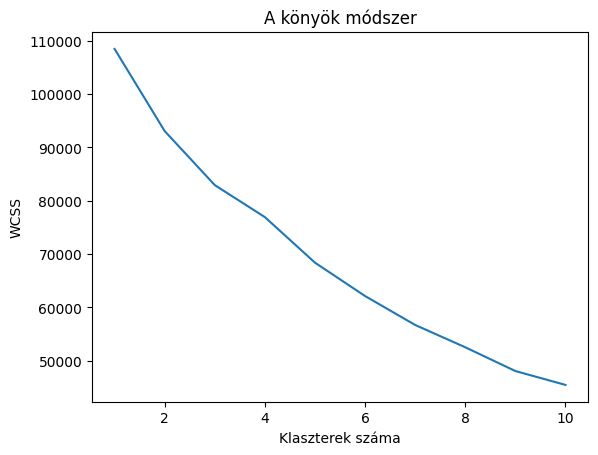

In [103]:
import pandas as pd
from sklearn.cluster import KMeans


import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler


X_vars = ['db_10', 'db_11', 'db_12', 'db_13', 'db_140', 'db_15', 'TIME2', 'total_time']
X = df[X_vars]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


#könyök módszer
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('A könyök módszer')
plt.xlabel('Klaszterek száma')
plt.ylabel('WCSS')
plt.show()

# K-means klaszterezés 2 alcsoportra
kmeans = KMeans(n_clusters=2, init='k-means++', random_state=42) # A klaszterek számát a könyök módszerrel határozhatod meg
df['klaszter'] = kmeans.fit_predict(X_scaled)
y_kmeans = kmeans.fit_predict(X_scaled)


In [104]:
#látszik, hogy a könyök módszer nem működik, egyszerűen csak legyen 2 klaszter

In [105]:
df['klaszter'].value_counts()

klaszter
0    8330
1    5229
Name: count, dtype: int64

In [106]:
kereszttabla = pd.crosstab(df['klaszter'], df['subscriber_or_cancelled'])

print(kereszttabla)

subscriber_or_cancelled  canceled  subscriber
klaszter                                     
0                            8329           1
1                            3206        2023


In [107]:
kereszttabla


subscriber_or_cancelled,canceled,subscriber
klaszter,,
0,8329,1
1,3206,2023


In [108]:
df_export = df[['distinct_id',  'db_8', 'db_9', 'db_10', 'db_12', 'db_11',
       'db_13', 'db_14', 'db_15', 'db_142', 'db_141', 'trial', 'subscriber',
       'canceled', 'total_time', 'darab', 'TIME2', 'country_code',
       'os_version', 'country_name', 'Continent', 'Population', 'average_time',
       'median_all', 'median_non_zero', 'modus_all', 'modus_non_zero',
       'db_valodi', 'time_per_darab', 'time_per_valodi_darab',
       'subscriber_or_cancelled', 'klaszter', 'os_main_version',
               
               ]]

df_export.to_excel('.\cluster.xlsx')

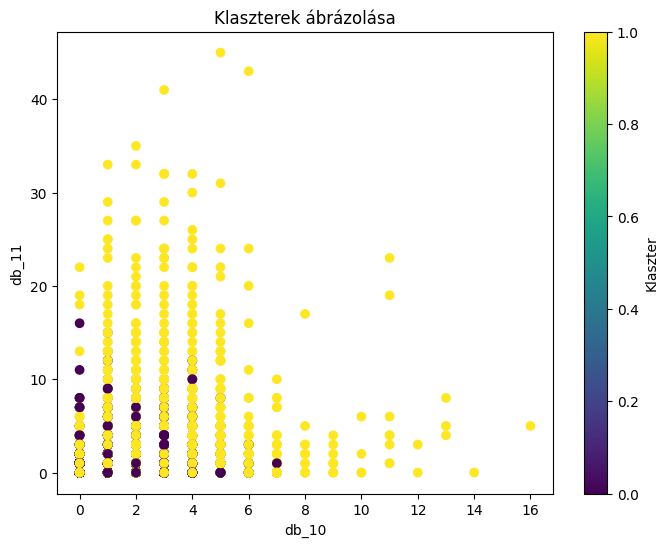

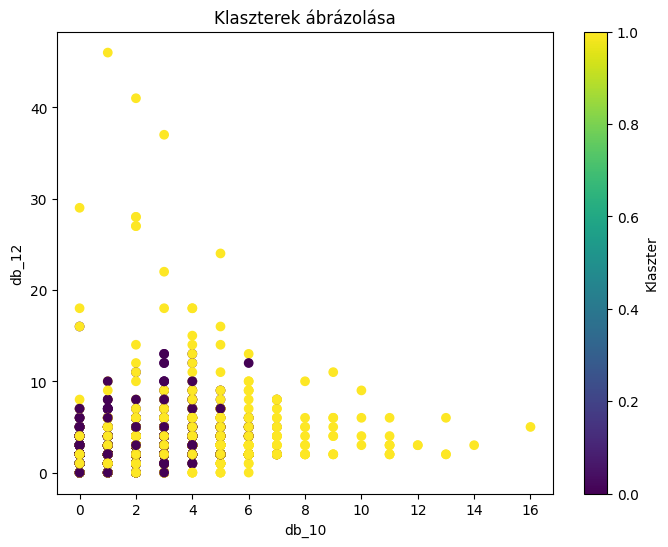

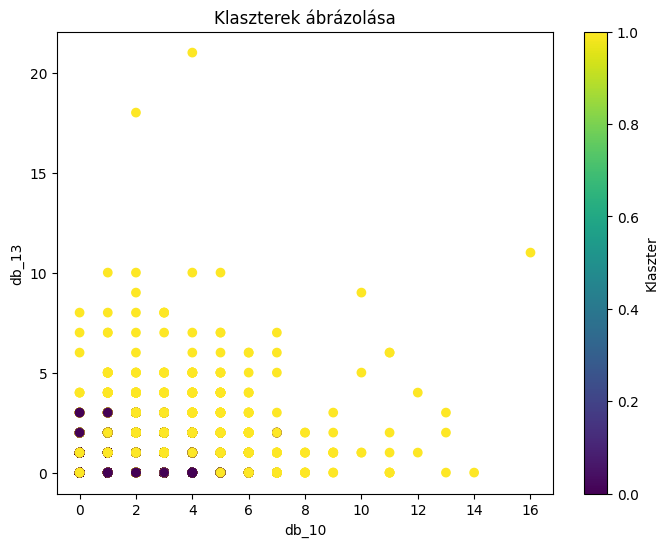

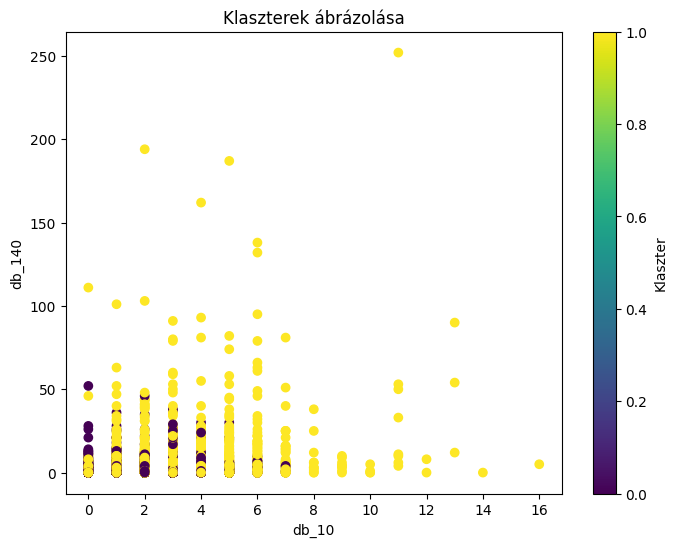

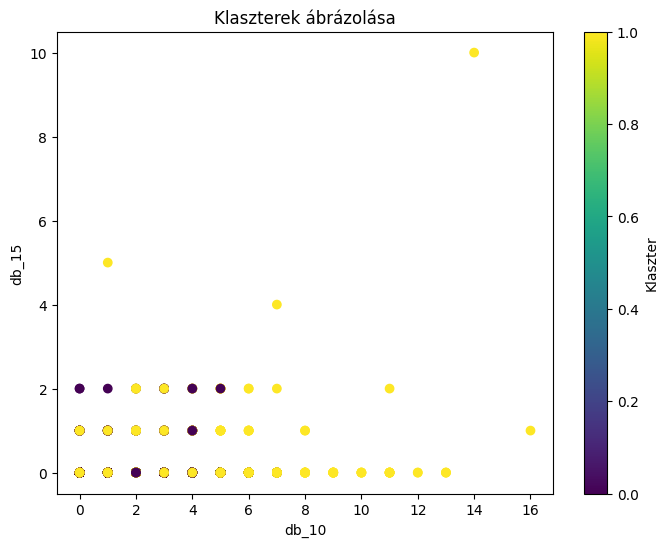

...

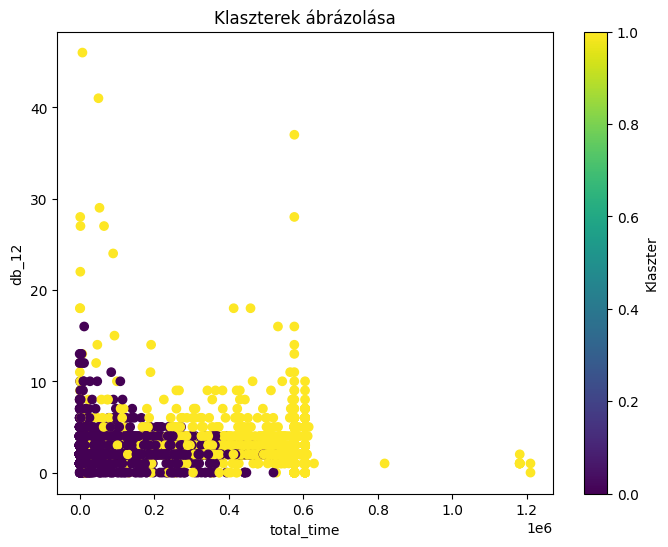

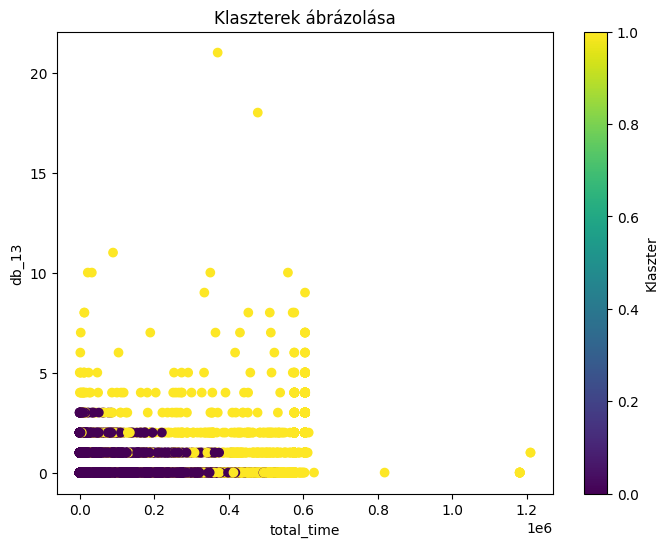

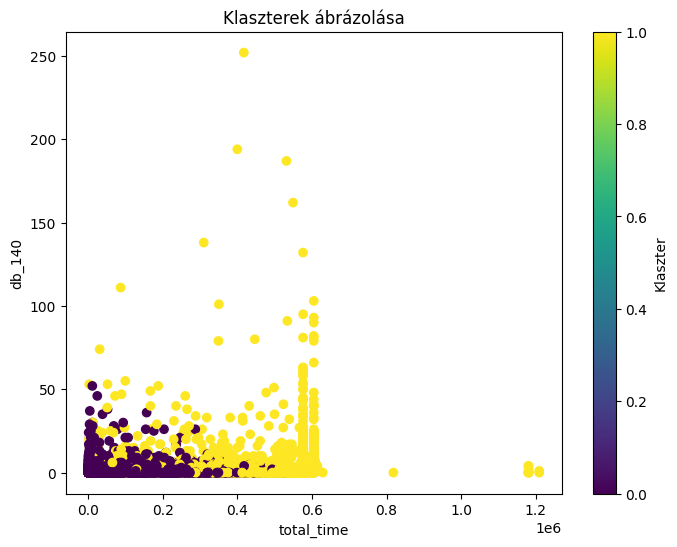

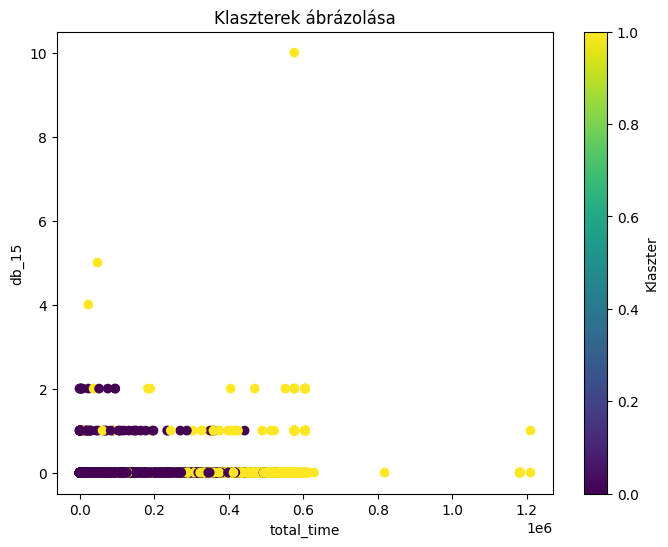

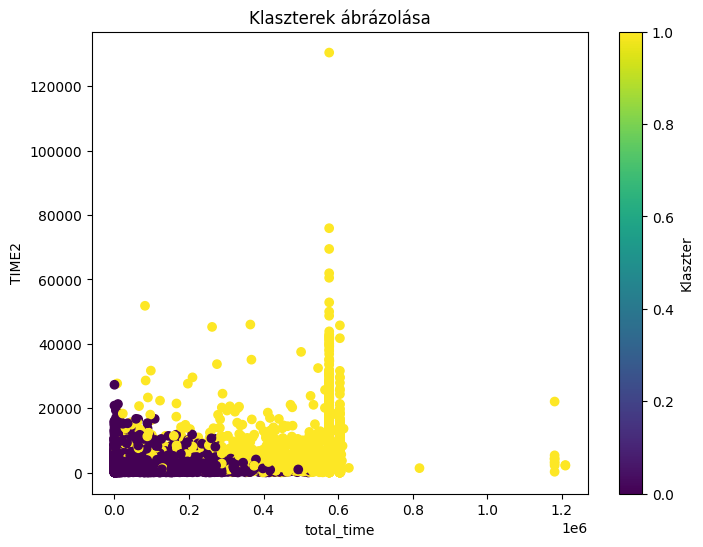

In [109]:
for x_tengely in X_vars:
    for y_tengely in X_vars:
        if (x_tengely != y_tengely): 
            plt.figure(figsize=(8, 6))
            plt.scatter(df[x_tengely], df[y_tengely], c=df['klaszter'], cmap='viridis')
            plt.xlabel(x_tengely)
            plt.ylabel(y_tengely)
            plt.title('Klaszterek ábrázolása')
            plt.colorbar(label='Klaszter')
            plt.show()

In [110]:
df['csoport'] = np.nan
df.loc[ (df['klaszter']==1) &  (df['subscriber_or_cancelled']=='subscriber'), 'csoport'] = "subscriber"
df.loc[ (df['klaszter']==1) &  (df['subscriber_or_cancelled']=='canceled'), 'csoport'] = "potential"
df.loc[ (df['klaszter']==0) &  (df['subscriber_or_cancelled']=='canceled'), 'csoport'] = "unsalvageable"
df['csoport'].value_counts()


csoport
unsalvageable    8329
potential        3206
subscriber       2023
Name: count, dtype: int64

In [111]:
time_vars = ['dayofyear_0',
 'dayofyear_1',
 'dayofyear_2',
 'dayofyear_3',
 'dayofyear_4',
 'dayofyear_5',
 'dayofyear_6',
 'dayofyear_7',
 'dayofyear_8',
 'dayofyear_9',
 'dayofyear_10',
 'dayofyear_11',
 'dayofyear_12',
 'dayofyear_13',
 'dayofyear_14',
 'dayofyear_15',
 'dayofyear_16',
 'dayofyear_17',
 'dayofyear_18',
 'dayofyear_19',
 'dayofyear_20',
 'dayofyear_21',
 'dayofyear_22',
 'dayofyear_23',
 'dayofyear_24',
 'dayofyear_25',
 'dayofyear_26',
 'dayofyear_27',
 'dayofyear_28',
 'dayofyear_29',
 'dayofyear_30',
 'dayofyear_31',
 'dayofyear_32',
 'dayofyear_33',
 'dayofyear_34',
 'dayofyear_35',
 'dayofyear_36',
 'dayofyear_37',
 'dayofyear_38',
 'dayofyear_39',
 'dayofyear_40',
 'dayofyear_41',
 'dayofyear_42',
 'dayofyear_43',
 'dayofyear_44',
 'dayofyear_45',
 'dayofyear_46',
 'dayofyear_47',
 'dayofyear_48',
 'dayofyear_49',
 'dayofyear_50',
 'dayofyear_51',
 'dayofyear_52',
 'dayofyear_53',
 'dayofyear_54',
 'dayofyear_55',
 'dayofyear_56',
 'dayofyear_57',
 'dayofyear_58',
 'dayofyear_59',
            'tmp_0',
 'tmp_1',
 'tmp_2',
 'tmp_3',
 'tmp_4',
 'tmp_5',
 'tmp_6',
 'tmp_7',
 'tmp_8',
 'tmp_9',
 'tmp_10',
 'tmp_11',
 'tmp_12',
 'tmp_13',
 'tmp_14',
 'tmp_15',
 'tmp_16',
 'tmp_17',
 'tmp_18',
 'tmp_19',
 'tmp_20',
 'tmp_21',
 'tmp_22',
 'tmp_23',
 'tmp_24',
 'tmp_25',
 'tmp_26',
 'tmp_27',
 'tmp_28',
 'tmp_29',
 'tmp_30',
 'tmp_31',
 'tmp_32',
 'tmp_33',
 'tmp_34',
 'tmp_35',
 'tmp_36',
 'tmp_37',
 'tmp_38',
 'tmp_39',
 'tmp_40',
 'tmp_41',
 'tmp_42',
 'tmp_43',
 'tmp_44',
 'tmp_45',
 'tmp_46',
 'tmp_47',
 'tmp_48',
 'tmp_49',
 'tmp_50',
 'tmp_51',
 'tmp_52',
 'tmp_53',
 'tmp_54',
 'tmp_55',
 'tmp_56',
 'tmp_57',
 'tmp_58']

In [112]:
df_melted = df.melt(id_vars=['csoport'],
                    value_vars=[f'dayofyear_{i}' for i in range(60)],
                    var_name='dayofyear',
                    value_name='darabszam')
df_melted['nap'] = df_melted['dayofyear'].str.split('_').str[1].astype(int)
df_melted = df_melted.sort_values(by='nap')
df_melted

,csoport,dayofyear,darabszam,nap
0,unsalvageable,dayofyear_0,0.0,0
9033,subscriber,dayofyear_0,0.0,0
9034,potential,dayofyear_0,0.0,0
9035,unsalvageable,dayofyear_0,0.0,0
9036,unsalvageable,dayofyear_0,0.0,0
...,...,...,...,...
804504,unsalvageable,dayofyear_59,0.0,59
804505,unsalvageable,dayofyear_59,0.0,59
804506,unsalvageable,dayofyear_59,0.0,59
804482,subscriber,dayofyear_59,0.0,59


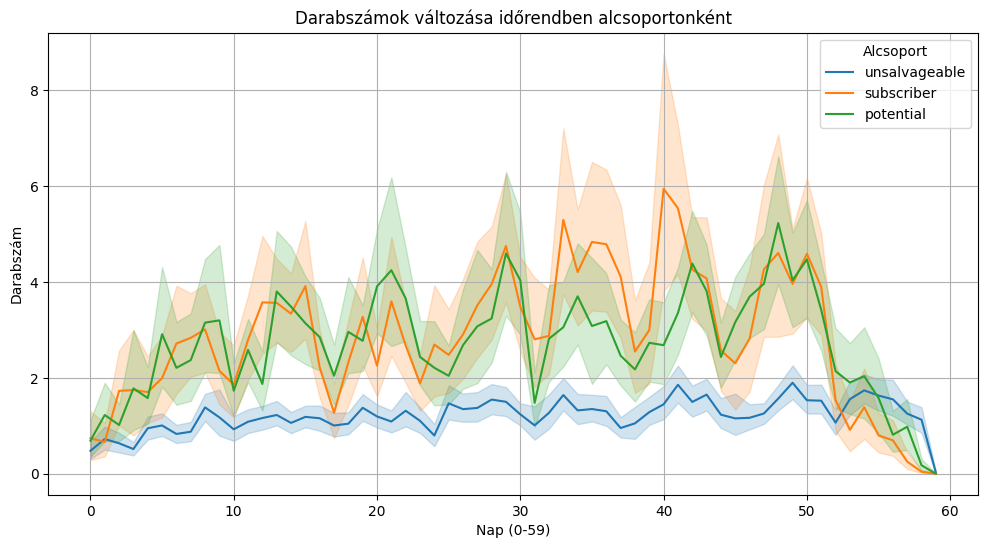

In [113]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='nap', y='darabszam', hue='csoport', data=df_melted)
plt.title('Darabszámok változása időrendben alcsoportonként')
plt.xlabel('Nap (0-59)')
plt.ylabel('Darabszám')
plt.grid(True)
plt.legend(title='Alcsoport')
plt.show()

In [114]:
df_melted = df.melt(id_vars=['csoport'],
                    value_vars=[f'week_{i}' for i in [1,2,3,4,5,6,7,8,9]],
                    var_name='week',
                    value_name='darabszam')
df_melted['nap'] = df_melted['week'].str.split('_').str[1].astype(int)
df_melted = df_melted.sort_values(by='nap')
df_melted

,csoport,week,darabszam,nap
0,unsalvageable,week_1,0.0,1
9033,subscriber,week_1,0.0,1
9034,potential,week_1,0.0,1
9035,unsalvageable,week_1,0.0,1
9036,unsalvageable,week_1,0.0,1
...,...,...,...,...
112995,unsalvageable,week_9,0.0,9
112996,unsalvageable,week_9,0.0,9
112997,unsalvageable,week_9,0.0,9
112973,subscriber,week_9,0.0,9


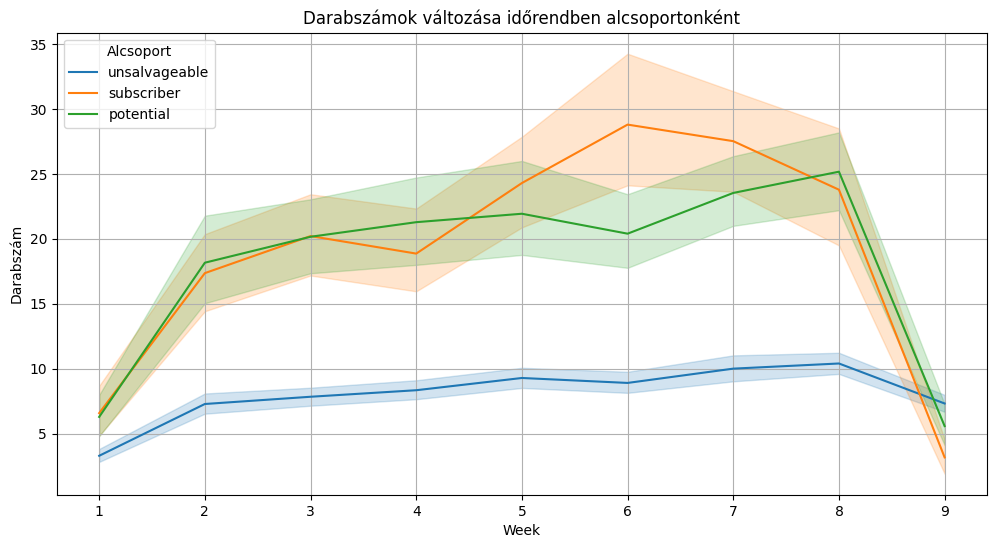

In [115]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='nap', y='darabszam', hue='csoport', data=df_melted)
plt.title('Darabszámok változása időrendben alcsoportonként')
plt.xlabel('Week')
plt.ylabel('Darabszám')
plt.grid(True)
plt.legend(title='Alcsoport')
plt.show()

In [116]:
df_melted = df.melt(id_vars=['csoport'],
                    value_vars=[f'weekday_{i}' for i in [0,1,2,3,4,5,6]],
                    var_name='weekday',
                    value_name='darabszam')
df_melted['nap'] = df_melted['weekday'].str.split('_').str[1].astype(int)
df_melted = df_melted.sort_values(by='nap')
df_melted

,csoport,weekday,darabszam,nap
0,unsalvageable,weekday_0,0.0,0
9033,subscriber,weekday_0,0.0,0
9034,potential,weekday_0,0.0,0
9035,unsalvageable,weekday_0,0.0,0
9036,unsalvageable,weekday_0,70.0,0
...,...,...,...,...
85877,unsalvageable,weekday_6,0.0,6
85878,unsalvageable,weekday_6,0.0,6
85879,unsalvageable,weekday_6,22.0,6
85855,subscriber,weekday_6,0.0,6


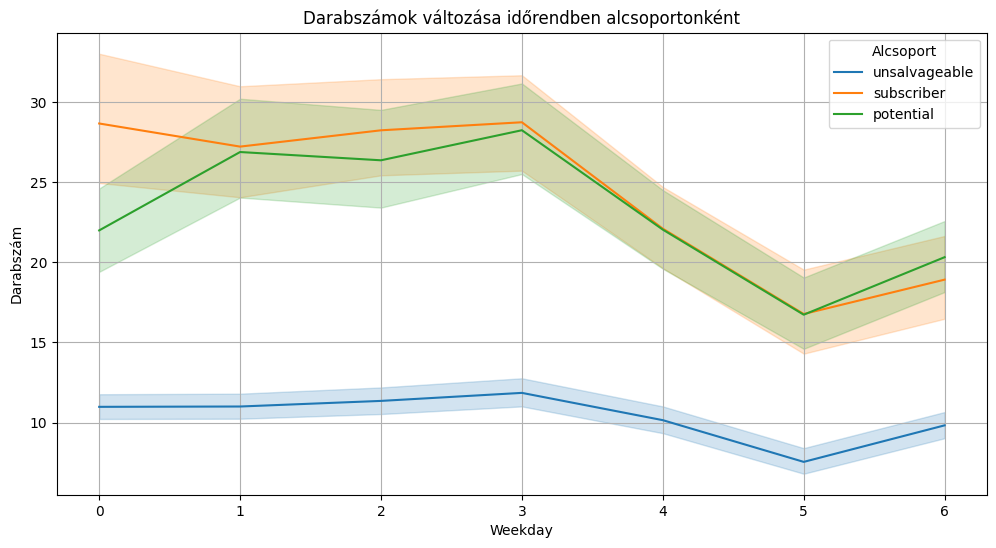

In [117]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='nap', y='darabszam', hue='csoport', data=df_melted)
plt.title('Darabszámok változása időrendben alcsoportonként')
plt.xlabel('Weekday')
plt.ylabel('Darabszám')
plt.grid(True)
plt.legend(title='Alcsoport')
plt.show()

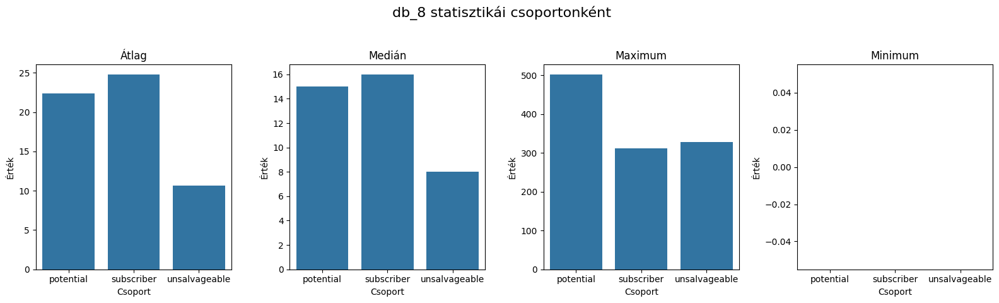

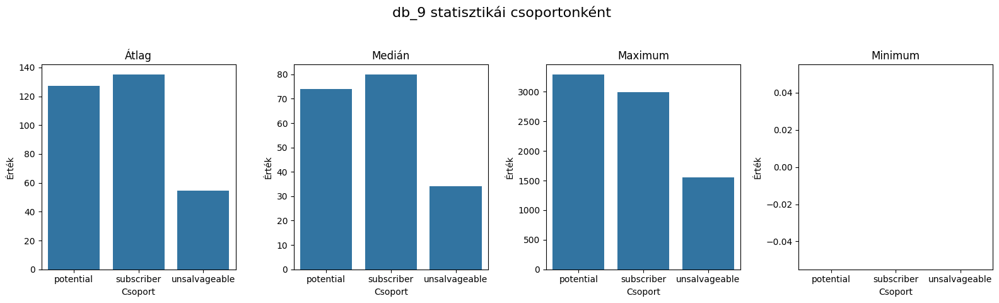

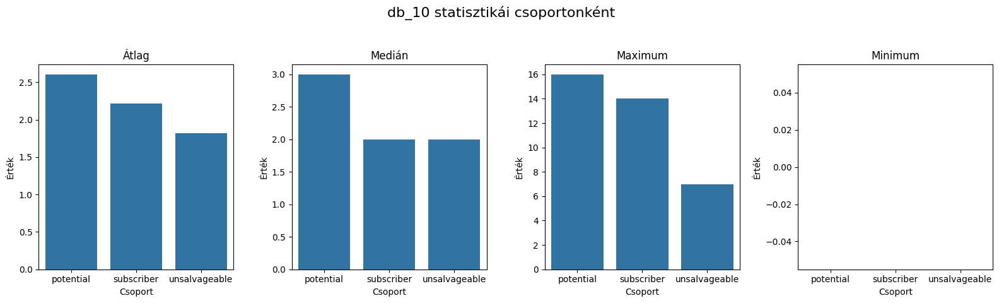

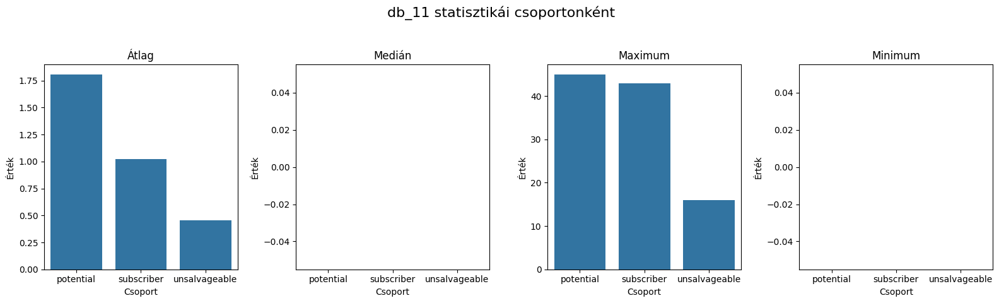

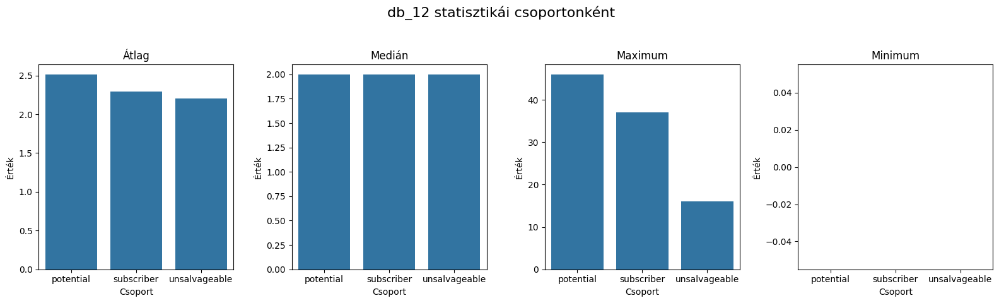

...

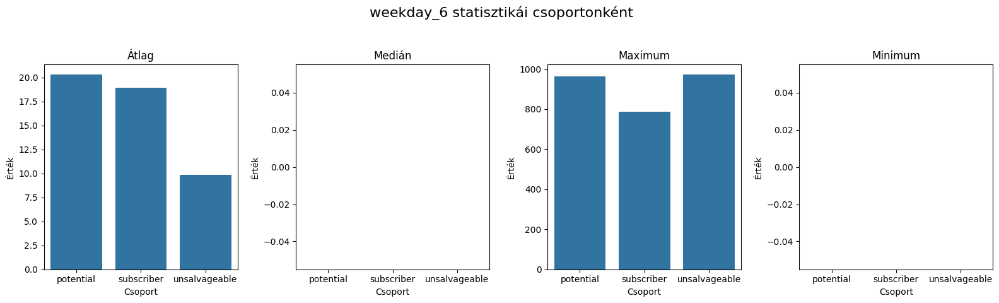

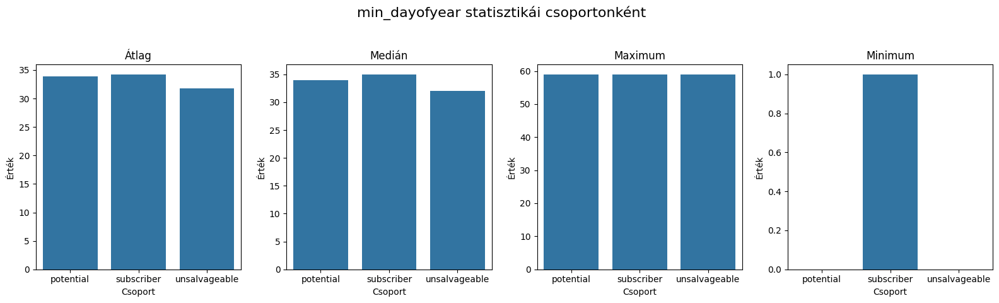

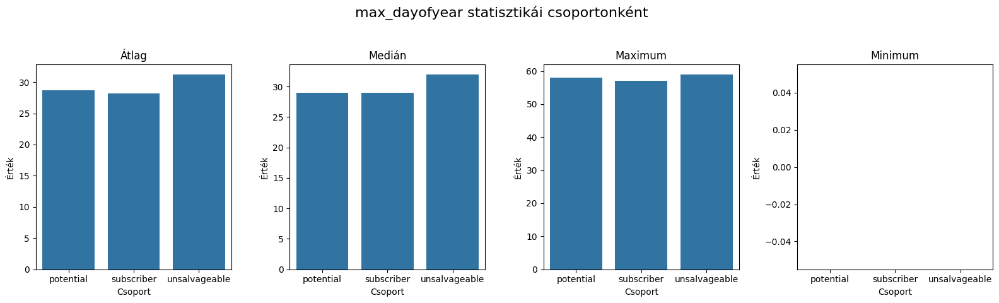

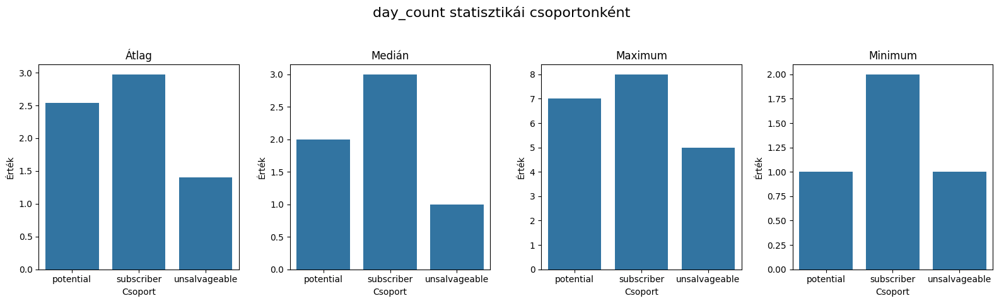

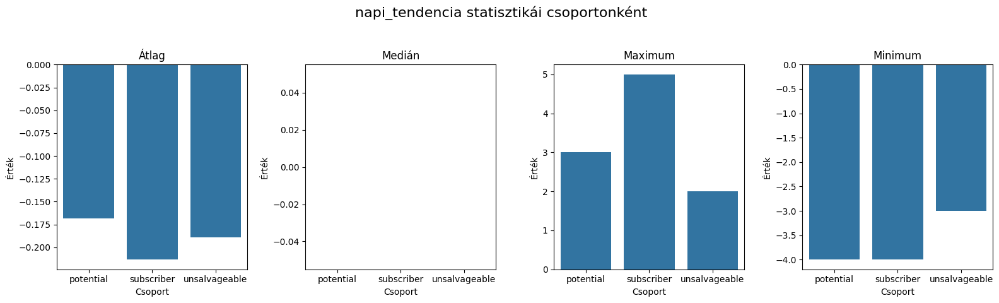

In [118]:
for var in variables:
    grouped_stats = df.groupby('csoport')[var].agg(['mean', 'median', 'max', 'min']).reset_index()

    fig, axes = plt.subplots(1, 4, figsize=(16, 5))
    fig.suptitle(f'{var} statisztikái csoportonként', fontsize=16)
    
    sns.barplot(x='csoport', y='mean', data=grouped_stats, ax=axes[0])
    axes[0].set_title('Átlag')
    axes[0].set_xlabel('Csoport')
    axes[0].set_ylabel('Érték')
    
    sns.barplot(x='csoport', y='median', data=grouped_stats, ax=axes[1])
    axes[1].set_title('Medián')
    axes[1].set_xlabel('Csoport')
    axes[1].set_ylabel('Érték')
    
    sns.barplot(x='csoport', y='max', data=grouped_stats, ax=axes[2])
    axes[2].set_title('Maximum')
    axes[2].set_xlabel('Csoport')
    axes[2].set_ylabel('Érték')
    
    sns.barplot(x='csoport', y='min', data=grouped_stats, ax=axes[3])
    axes[3].set_title('Minimum')
    axes[3].set_xlabel('Csoport')
    axes[3].set_ylabel('Érték')
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # A címnek hagy helyet
    plt.show()

In [119]:
#db_8/db_9 kb pariban vannak
#a potenciálnak kicsit több idegestő dolog jut, ezt csökkenteni
#a potenciálnak  több hiba dolog jut, ezt csökkenteni
#extra tevékenység pariban van





In [120]:
df.loc[df['csoport']=='potential','week_9'].mean()

5.585776668746101

In [121]:
df.loc[df['csoport']=='subscriber','week_9'].mean()

3.175976272862086

In [122]:
3.17/5.58


0.568100358422939

In [123]:
df.loc[df['csoport']=='potential','time_per_valodi_darab'].mean()

55.23449754381735

In [124]:
df.loc[df['csoport']=='subscriber','time_per_valodi_darab'].mean()

64.27832253447643

In [125]:
df['cs_subscriber'] = 0
df.loc[df['csoport'] == 'subscriber','cs_subscriber'] = 1
df['cs_potential'] = 0
df.loc[df['csoport'] == 'potential','cs_potential'] = 1
df['cs_unsalvageable'] = 0
df.loc[df['csoport'] == 'unsalvageable','cs_unsalvageable'] = 1


In [126]:
pivot_df = df.pivot_table( columns='csoport', values=['weekend','weekday'], aggfunc='sum')
pivot_df['subscriber_%'] = (pivot_df['subscriber'] /pivot_df['subscriber'].sum()  )*100 
pivot_df['potential_%'] = ( pivot_df['potential'] /pivot_df['potential'].sum() ) *100 
pivot_df['unsalvageable_%'] = ( pivot_df['unsalvageable'] /pivot_df['unsalvageable'].sum() ) *100 

pivot_df['subscriber_%2'] = (pivot_df['subscriber'] /df['cs_subscriber'].sum()  ) 
pivot_df['potential_%2'] = ( pivot_df['potential'] /df['cs_potential'].sum() ) 
pivot_df['unsalvageable_%2'] = ( pivot_df['unsalvageable'] /df['cs_unsalvageable'].sum() ) 

pivot_df

csoport,potential,subscriber,unsalvageable,subscriber_%,potential_%,unsalvageable_%,subscriber_%2,potential_%2,unsalvageable_%2
weekday,402304.0,272934.0,460946.0,79.081506,77.207878,76.103255,134.915472,125.484716,55.342298
weekend,118762.0,72196.0,144739.0,20.918494,22.792122,23.896745,35.687593,37.043668,17.377716


In [127]:
df['weekend_per_day'] = df['weekend']/2
df['weekday_per_day'] = df['weekday']/5


In [128]:
pivot_df = df.pivot_table( columns='csoport', values=['weekend_per_day','weekday_per_day'], aggfunc='sum')
pivot_df['subscriber_%'] = (pivot_df['subscriber'] /pivot_df['subscriber'].sum()  )*100 
pivot_df['potential_%'] = ( pivot_df['potential'] /pivot_df['potential'].sum() ) *100 
pivot_df['unsalvageable_%'] = ( pivot_df['unsalvageable'] /pivot_df['unsalvageable'].sum() ) *100 

pivot_df['subscriber_%2'] = (pivot_df['subscriber'] /df['cs_subscriber'].sum()  ) 
pivot_df['potential_%2'] = ( pivot_df['potential'] /df['cs_potential'].sum() ) 
pivot_df['unsalvageable_%2'] = ( pivot_df['unsalvageable'] /df['cs_unsalvageable'].sum() ) 

pivot_df

csoport,potential,subscriber,unsalvageable,subscriber_%,potential_%,unsalvageable_%,subscriber_%2,potential_%2,unsalvageable_%2
weekday_per_day,80460.8,54586.8,92189.2,60.193991,57.537017,56.022076,26.983094,25.096943,11.068460
weekend_per_day,59381.0,36098.0,72369.5,39.806009,42.462983,43.977924,17.843796,18.521834,8.688858


In [129]:
pivot_df = df.pivot_table( columns='csoport', values=['weekday_0','weekday_1','weekday_2','weekday_3','weekday_4','weekday_5','weekday_6'], aggfunc='sum')
pivot_df['subscriber_%'] = (pivot_df['subscriber'] /pivot_df['subscriber'].sum()  )*100 
pivot_df['potential_%'] = ( pivot_df['potential'] /pivot_df['potential'].sum() ) *100 
pivot_df['unsalvageable_%'] = ( pivot_df['unsalvageable'] /pivot_df['unsalvageable'].sum() ) *100 

pivot_df['subscriber_%2'] = (pivot_df['subscriber'] /df['cs_subscriber'].sum()  ) 
pivot_df['potential_%2'] = ( pivot_df['potential'] /df['cs_potential'].sum() ) 
pivot_df['unsalvageable_%2'] = ( pivot_df['unsalvageable'] /df['cs_unsalvageable'].sum() ) 

pivot_df

csoport,potential,subscriber,unsalvageable,subscriber_%,potential_%,unsalvageable_%,subscriber_%2,potential_%2,unsalvageable_%2
weekday_0,70486.0,57965.0,91474.0,16.795121,13.527269,15.102570,28.652991,21.985652,10.982591
weekday_1,86157.0,55049.0,91643.0,15.950222,16.534758,15.130472,27.211567,26.873674,11.002881
weekday_2,84503.0,57106.0,94556.0,16.546229,16.217331,15.611415,28.228374,26.357767,11.352623
weekday_3,90514.0,58120.0,98724.0,16.840031,17.370928,16.299562,28.729609,28.232689,11.853044
weekday_4,70644.0,44694.0,84549.0,12.949903,13.557592,13.959236,22.092931,22.034934,10.151159
weekday_5,53630.0,33930.0,62882.0,9.831078,10.292362,10.381964,16.772121,16.728010,7.549766
weekday_6,65132.0,38266.0,81857.0,11.087416,12.499760,13.514781,18.915472,20.315658,9.827951


In [130]:
df.columns.tolist()

['index',
 'distinct_id',
 'db_8',
 'db_9',
 'db_10',
 'db_12',
 'db_11',
 'db_13',
 'db_140',
 'db_14',
 'db_142',
 'db_141',
 'db_15',
 'db_8_b',
 'db_9_b',
 'db_10_b',
 'db_11_b',
 'db_12_b',
 'db_13_b',
 'db_140_b',
 'db_14_b',
 'db_141_b',
 'db_142_b',
 'db_15_b',
 'trial',
 'subscriber',
 'canceled',
 'subscriber_or_cancelled',
 'darab',
 'db_valodi',
 'time_per_darab',
 'time_per_valodi_darab',
 'total_time',
 'TIME2',
 'average_time',
 'median_all',
 'median_non_zero',
 'modus_all',
 'modus_non_zero',
 'country_code',
 'country_name',
 'Continent',
 'Population',
 'os_version',
 'week_1',
 'week_2',
 'week_3',
 'week_4',
 'week_5',
 'week_6',
 'week_7',
 'week_8',
 'week_9',
 'weekday_0',
 'weekday_1',
 'weekday_2',
 'weekday_3',
 'weekday_4',
 'weekday_5',
 'weekday_6',
 'weekend',
 'weekday',
 'min_dayofyear',
 'max_dayofyear',
 'day_count',
 'napi_tendencia',
 'dayofyear_0',
 'dayofyear_1',
 'dayofyear_2',
 'dayofyear_3',
 'dayofyear_4',
 'dayofyear_5',
 'dayofyear_6',
 'day

In [131]:
df_export = df[['distinct_id',  'db_8', 'db_9', 'db_10', 'db_12', 'db_11',
       'db_13', 'db_14', 'db_15', 'db_142', 'db_141', 'trial', 'subscriber',
       'canceled', 'total_time', 'darab', 'TIME2', 'country_code',
       'os_version', 'country_name', 'Continent', 'Population', 'average_time',
       'median_all', 'median_non_zero', 'modus_all', 'modus_non_zero',
       'db_valodi', 'time_per_darab', 'time_per_valodi_darab',
       'subscriber_or_cancelled', 'klaszter', 'os_main_version', 'csoport','week_1',
 'week_2',
 'week_3',
 'week_4',
 'week_5',
 'week_6',
 'week_7',
 'week_8',
 'week_9','weekend',
 'weekday','weekend_per_day',
 'weekday_per_day'
                
               ]]

df_export.to_excel('.\cluster.xlsx')

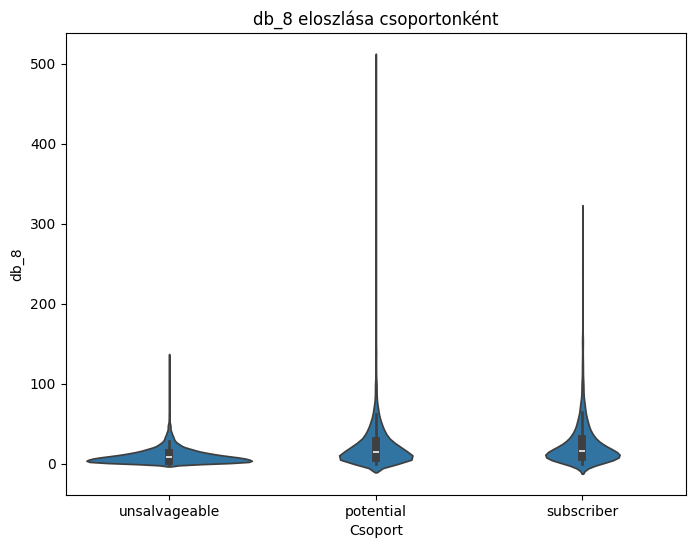

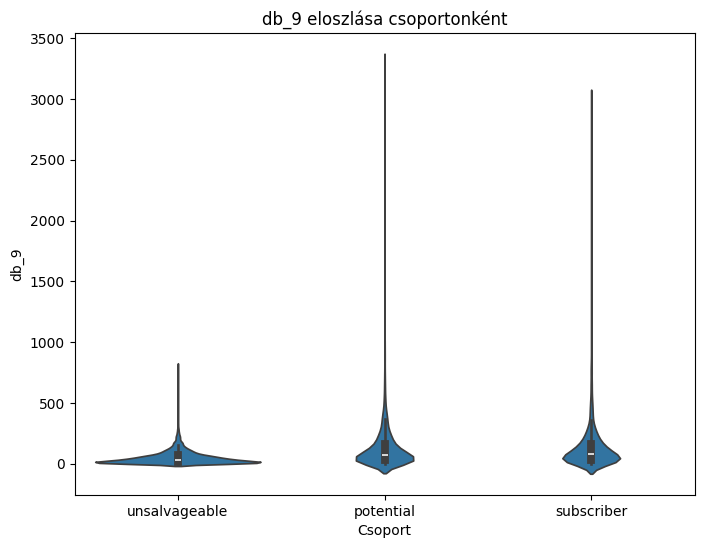

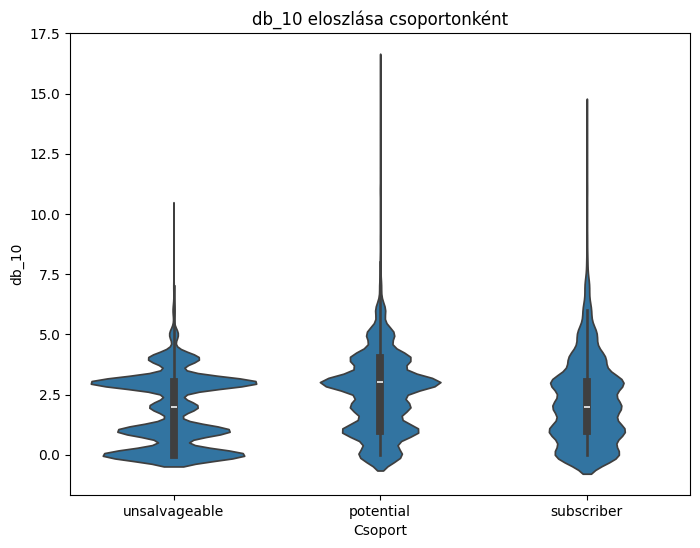

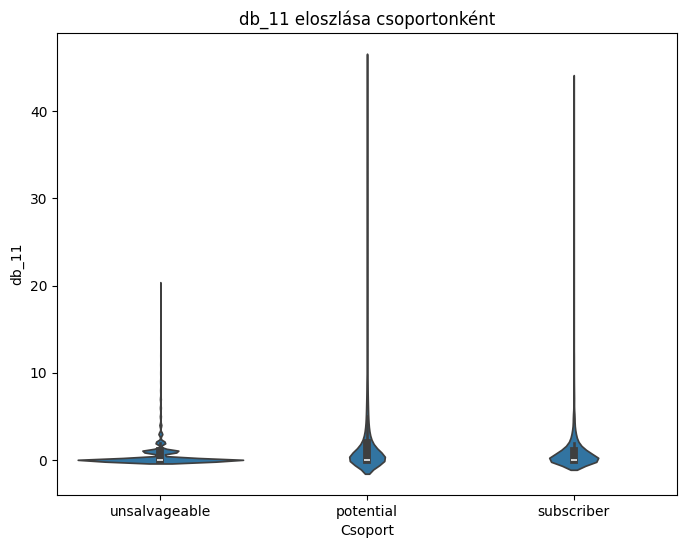

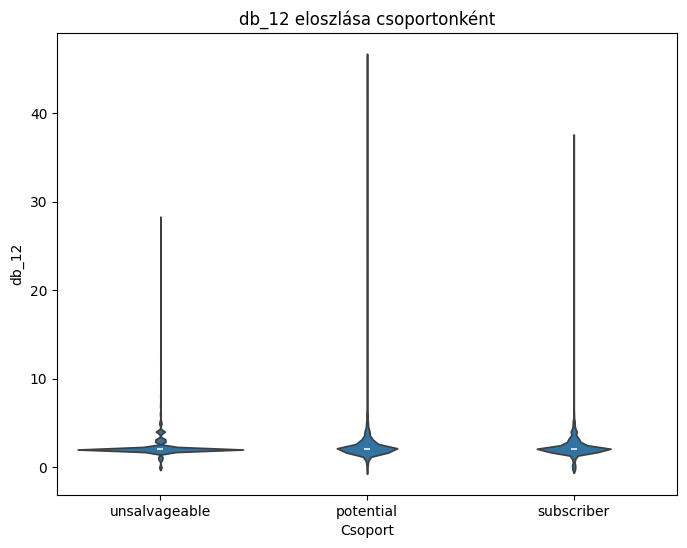

...

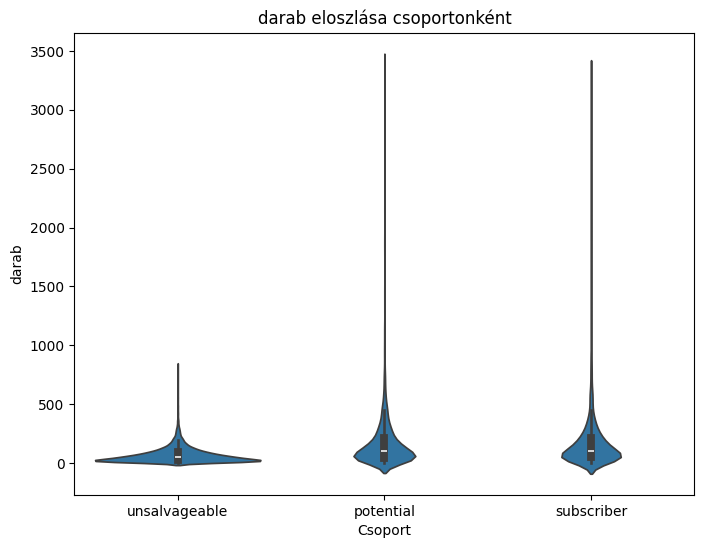

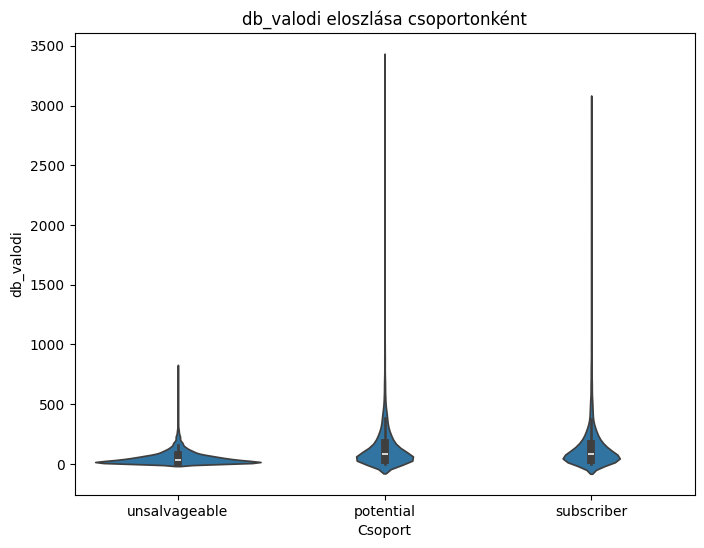

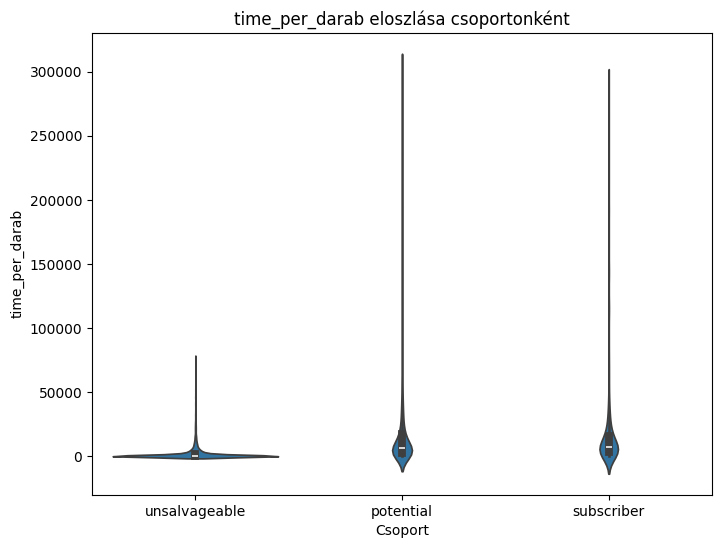

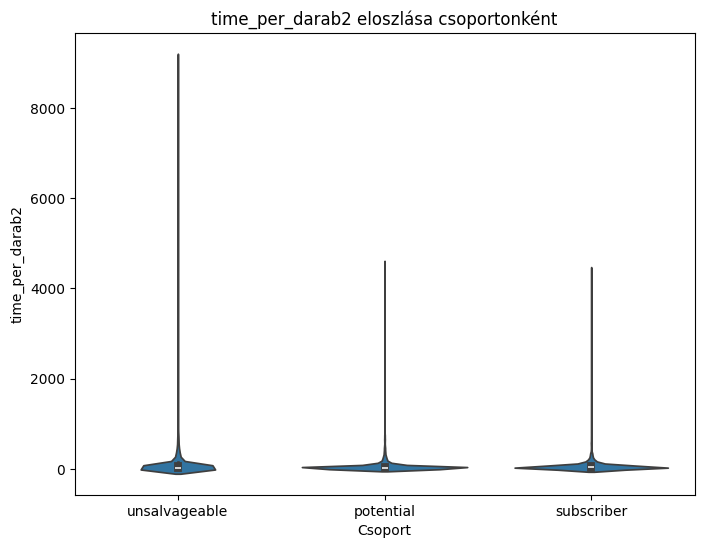

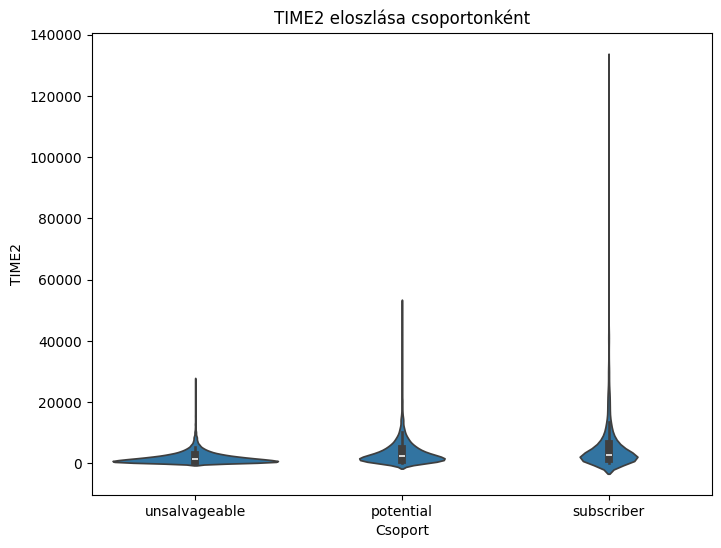

In [88]:

for var in variables:
    plt.figure(figsize=(8, 6))
    sns.violinplot(x='csoport', y=var, data=df)
    plt.title(f'{var} eloszlása csoportonként')
    plt.xlabel('Csoport')
    plt.ylabel(var)
    plt.show()

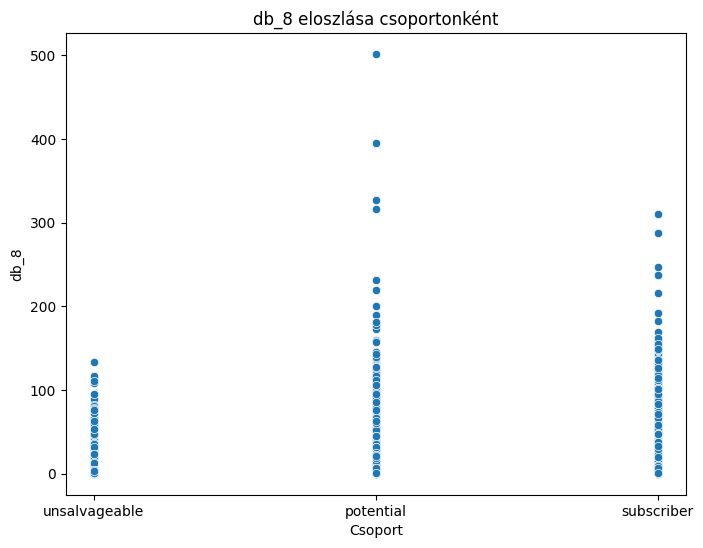

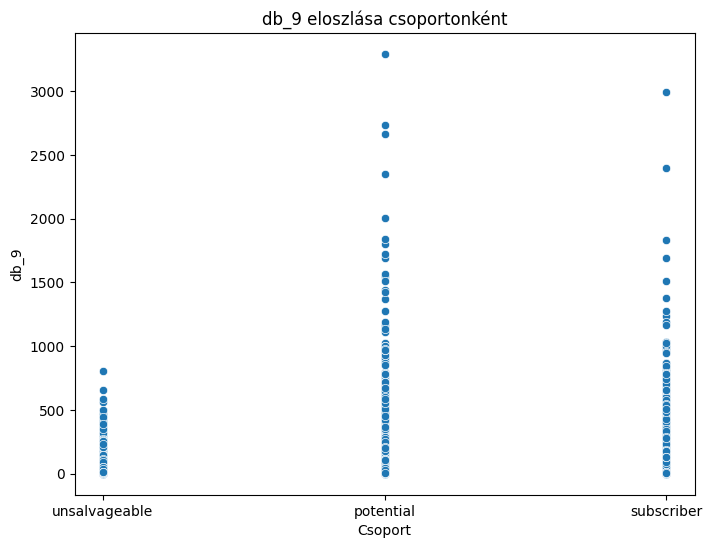

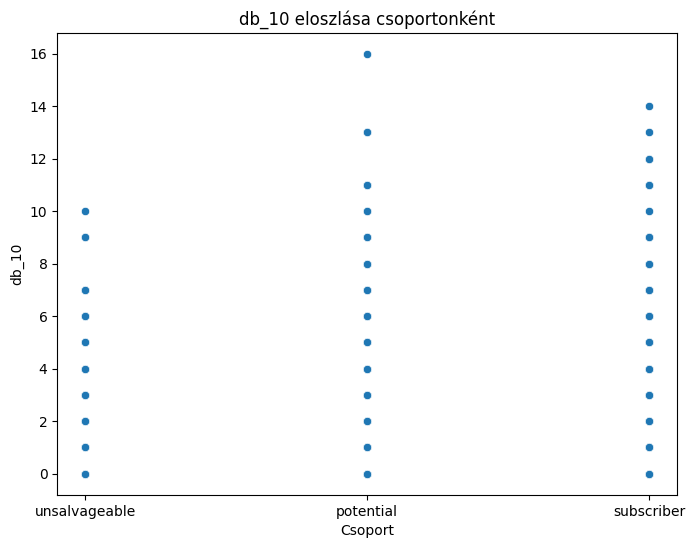

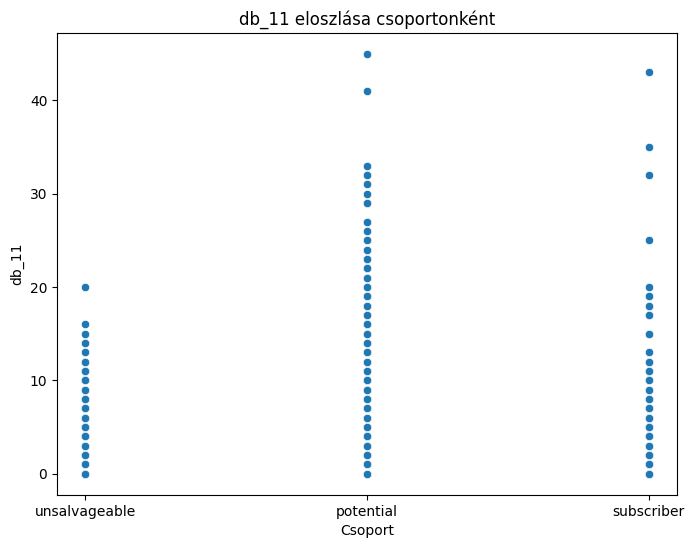

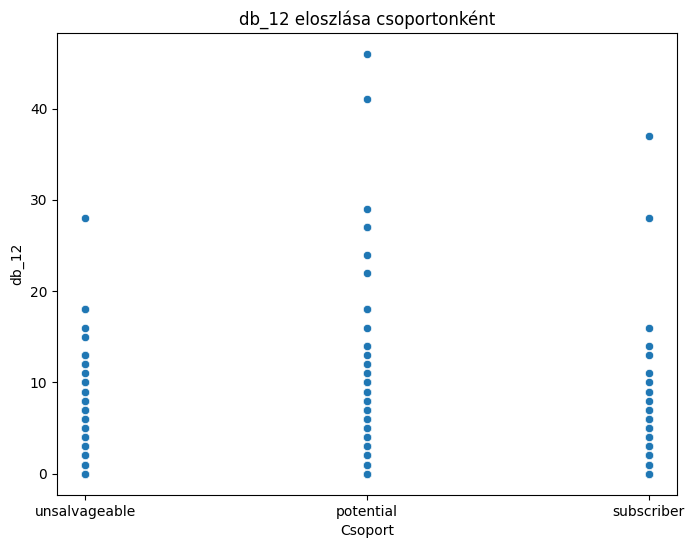

...

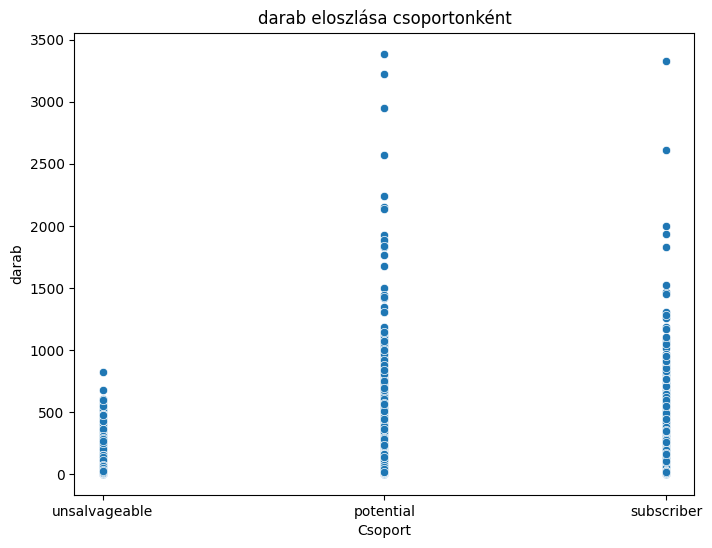

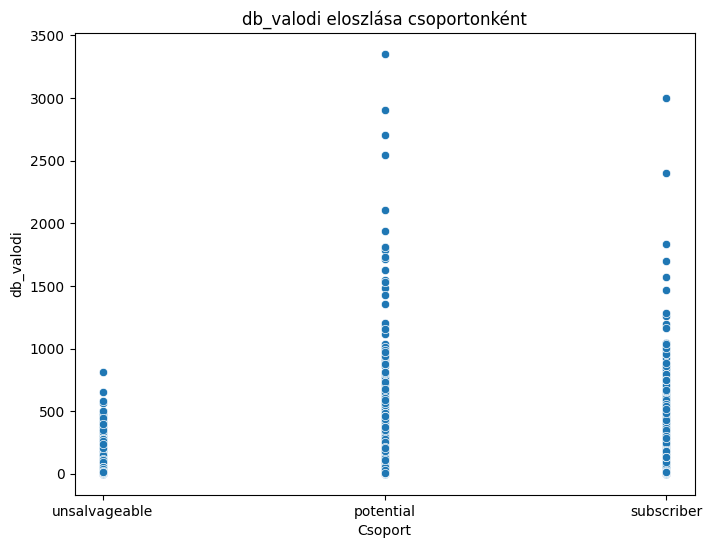

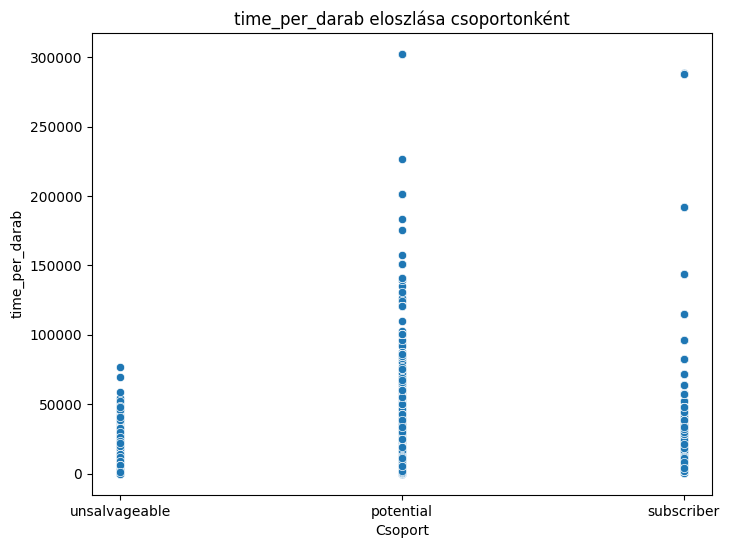

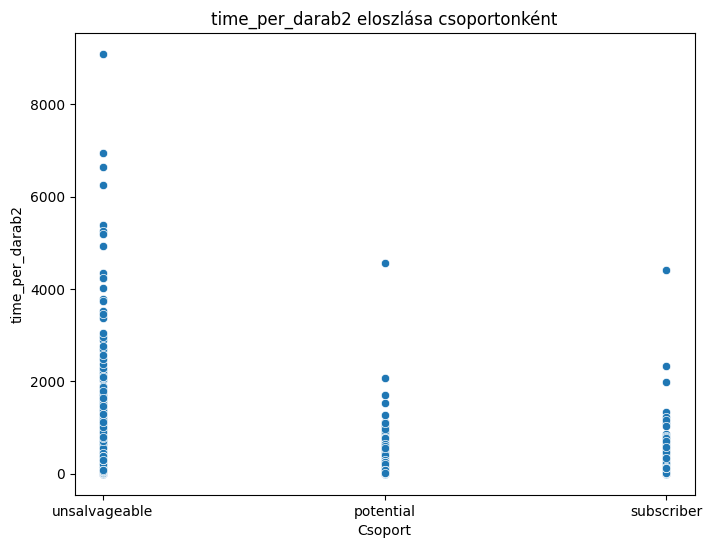

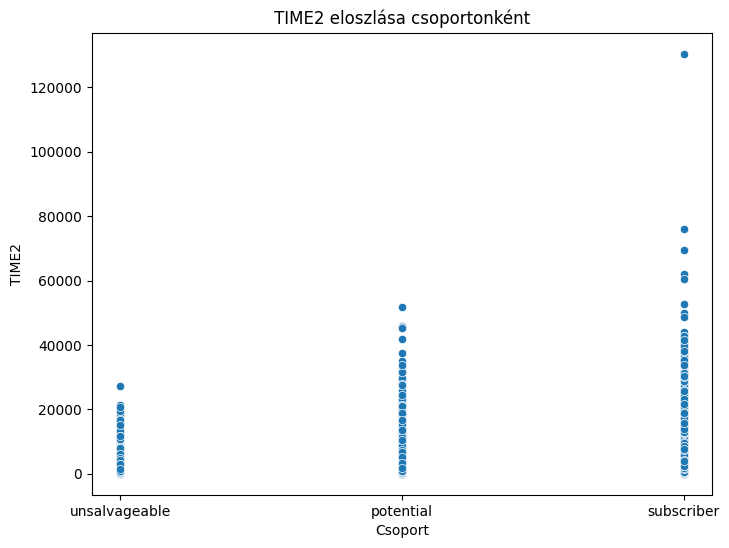

In [89]:

for var in variables:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x='csoport', y=var, data=df)
    plt.title(f'{var} eloszlása csoportonként')
    plt.xlabel('Csoport')
    plt.ylabel(var)
    plt.show()